In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Table of Contents

- [Introduction](#1)
- [Importing necessary libraries](#2)
- [Processing the dataset](#3)
- [Cleaning the dataset](#4)
- [Exploring and Analysing the dataset](#5)
- [Machine learning model](#6)
- [Model Evaluation](#7)
- [Conclusion](#8)
- [References](#9)

# **Importing Necessary Libraries:**

---



First of all, we will import all the necessary libraries that we will use throughout the project. This generally includes libraries for data manipulation, data visualization, and others based on the specific needs of the project.

---



In [ ]:
# Install required packages if not installed
!pip install plotly wordcloud kneed mlxtend pycaret pyclustering

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from pyclustering.cluster.kmedoids import kmedoids
from sklearn.ensemble import IsolationForest
from sklearn.decomposition import PCA
from kneed import KneeLocator
from scipy.stats import linregress
from matplotlib.colors import LinearSegmentedColormap
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tabulate import tabulate
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth, association_rules
from collections import Counter

# Set the option to suppress SettingWithCopyWarning
pd.set_option('mode.chained_assignment', None)

# **Processing The Dataset:**


---


Afterward, we are going to gain a thorough understanding of the dataset before proceeding to the data cleaning stage.

---


1.Reading the data

2.Summary statistics

### **1. Reading the Dataset**

In [ ]:
cust_df = pd.read_csv('/content/drive/MyDrive/data.csv', encoding='latin-1')
cust_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


### Dataset Description

| Variable    | Description                                                                                                           |
|-------------|-----------------------------------------------------------------------------------------------------------------------|
| InvoiceNo   | Code representing each unique transaction. If this code starts with letter 'c', it indicates a cancellation.           |
| StockCode   | Code uniquely assigned to each distinct product.                                                                      |
| Description | Description of each product.                                                                                          |
| Quantity    | The number of units of a product in a transaction.                                                                    |
| InvoiceDate | The date and time of the transaction.                                                                                 |
| UnitPrice   | The unit price of the product in sterling.                                                                            |
| CustomerID  | Identifier uniquely assigned to each customer.                                                                        |
| Country     | The country of the customer.                                                                                          |


**Gaining information**

In [ ]:
cust_df.info()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In [ ]:
cust_df.columns

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

### **2. Summary statistics**

Now, we are going to generate summary statistics to gain initial insights into the data distribution:

In [ ]:
# Summary statistics for numerical variables
cust_df.describe().T

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count,mean,std,min,25%,50%,75%,max
Quantity,541909.0,9.552250,218.081158,-80995.00,1.00,3.00,10.00,80995.0
UnitPrice,541909.0,4.611114,96.759853,-11062.06,1.25,2.08,4.13,38970.0
CustomerID,406829.0,15287.690570,1713.600303,12346.00,13953.00,15152.00,16791.00,18287.0


In [ ]:
# Summary statistics for categorical variables
cust_df.describe(include='object').T

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count,unique,top,freq
InvoiceNo,541909,25900,573585,1114
StockCode,541909,4070,85123A,2313
Description,540455,4223,WHITE HANGING HEART T-LIGHT HOLDER,2369
InvoiceDate,541909,23260,10/31/2011 14:41,1114
Country,541909,38,United Kingdom,495478


# **Data Cleaning:**

---
1.Handling Duplicates

2.Handling Missing Values

3.Cancelled Transactions

4.Removing Negative Quantities

5.StockCode Anomalies

6.Cleaning Description Column

7.Treating Zero Unit Prices

8.Cleaning Country Anomalies

9.Date-Time

10.Detecting Outliers

---



### **1. Handling Duplicates**

In [ ]:
# Finding duplicate rows (keeping all instances)
duplicate_rows = cust_df[cust_df.duplicated(keep=False)]

# Sorting the data by certain columns to see the duplicate rows next to each other
duplicate_rows_sorted = duplicate_rows.sort_values(by=['InvoiceNo', 'StockCode', 'Description', 'CustomerID', 'Quantity'])

# Displaying the first 10 records
duplicate_rows_sorted.head(10)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,12/1/2010 11:45,1.25,17908.0,United Kingdom
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,12/1/2010 11:45,1.25,17908.0,United Kingdom
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,12/1/2010 11:45,4.95,17908.0,United Kingdom
539,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,12/1/2010 11:45,4.95,17908.0,United Kingdom
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,12/1/2010 11:45,2.10,17908.0,United Kingdom
527,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,12/1/2010 11:45,2.10,17908.0,United Kingdom
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,12/1/2010 11:45,2.95,17908.0,United Kingdom
537,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,12/1/2010 11:45,2.95,17908.0,United Kingdom
578,536412,21448,12 DAISY PEGS IN WOOD BOX,1,12/1/2010 11:49,1.65,17920.0,United Kingdom
598,536412,21448,12 DAISY PEGS IN WOOD BOX,1,12/1/2010 11:49,1.65,17920.0,United Kingdom


In [ ]:
# Displaying the number of duplicate rows
print(f"The dataset contains {cust_df.duplicated().sum()} duplicate rows that need to be removed.")

# Removing duplicate rows
cust_df.drop_duplicates(inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The dataset contains 5268 duplicate rows that need to be removed.


In [ ]:
cust_df.duplicated().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


0

In [ ]:
#Getting the number of unique values
print(cust_df.nunique())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


InvoiceNo      25900
StockCode       4070
Description     4223
Quantity         722
InvoiceDate    23260
UnitPrice       1630
CustomerID      4372
Country           38
dtype: int64


### **2. Handling Missing Values**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


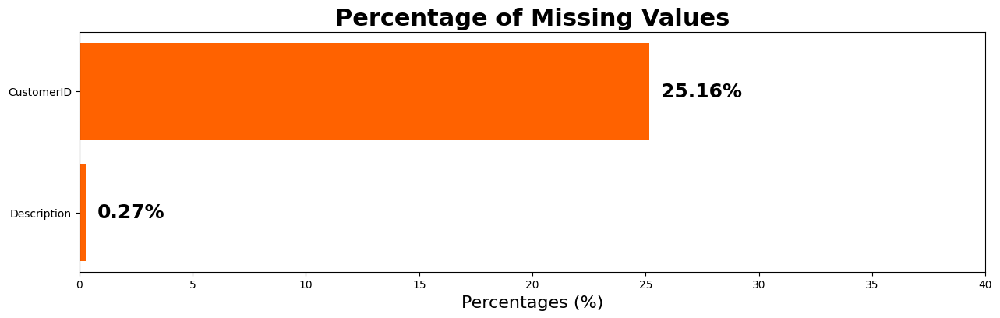

In [ ]:
# Calculating the percentage of missing values for each column
missing_data = cust_df.isnull().sum()
missing_percentage = (missing_data[missing_data > 0] / cust_df.shape[0]) * 100

# Prepare values
missing_percentage.sort_values(ascending=True, inplace=True)

# Plot the barh chart
fig, ax = plt.subplots(figsize=(15, 4))
ax.barh(missing_percentage.index, missing_percentage, color='#ff6200')

# Annotate the values and indexes
for i, (value, name) in enumerate(zip(missing_percentage, missing_percentage.index)):
    ax.text(value+0.5, i, f"{value:.2f}%", ha='left', va='center', fontweight='bold', fontsize=18, color='black')

# Set x-axis limit
ax.set_xlim([0, 40])

# Add title and xlabel
plt.title("Percentage of Missing Values", fontweight='bold', fontsize=22)
plt.xlabel('Percentages (%)', fontsize=16)
plt.show()

In [ ]:
cust_df.isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135037
Country             0
dtype: int64

Description and CustomerID

In [ ]:
# Extracting rows with missing values in 'CustomerID' or 'Description' columns
cust_df[cust_df['CustomerID'].isnull() | cust_df['Description'].isnull()]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,12/1/2010 11:52,0.00,NaN,United Kingdom
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,12/1/2010 14:32,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,12/1/2010 14:32,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,12/1/2010 14:32,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,12/1/2010 14:32,1.66,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
541536,581498,85099B,JUMBO BAG RED RETROSPOT,5,12/9/2011 10:26,4.13,NaN,United Kingdom
541537,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,12/9/2011 10:26,4.13,NaN,United Kingdom
541538,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,12/9/2011 10:26,4.96,NaN,United Kingdom
541539,581498,85174,S/4 CACTI CANDLES,1,12/9/2011 10:26,10.79,NaN,United Kingdom


In [ ]:
# Drop rows where both CustomerID and Description are missing
cust_df.dropna(subset=['CustomerID', 'Description'], how='all', inplace=True)
cust_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [ ]:
cust_df.isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     133583
Country             0
dtype: int64

CustomerID


In [ ]:
# Replace missing CustomerID values with the corresponding CustomerID where InvoiceNo is the same
cust_df['CustomerID'] = cust_df.groupby('InvoiceNo')['CustomerID'].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.mode().empty else np.nan))
cust_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [ ]:
cust_df.isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     133583
Country             0
dtype: int64

In [ ]:
filtered_df = cust_df[cust_df['CustomerID'].isnull()]
filtered_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
1443,536544,21773,DECORATIVE ROSE BATHROOM BOTTLE,1,12/1/2010 14:32,2.51,NaN,United Kingdom
1444,536544,21774,DECORATIVE CATS BATHROOM BOTTLE,2,12/1/2010 14:32,2.51,NaN,United Kingdom
1445,536544,21786,POLKADOT RAIN HAT,4,12/1/2010 14:32,0.85,NaN,United Kingdom
1446,536544,21787,RAIN PONCHO RETROSPOT,2,12/1/2010 14:32,1.66,NaN,United Kingdom
1447,536544,21790,VINTAGE SNAP CARDS,9,12/1/2010 14:32,1.66,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
541536,581498,85099B,JUMBO BAG RED RETROSPOT,5,12/9/2011 10:26,4.13,NaN,United Kingdom
541537,581498,85099C,JUMBO BAG BAROQUE BLACK WHITE,4,12/9/2011 10:26,4.13,NaN,United Kingdom
541538,581498,85150,LADIES & GENTLEMEN METAL SIGN,1,12/9/2011 10:26,4.96,NaN,United Kingdom
541539,581498,85174,S/4 CACTI CANDLES,1,12/9/2011 10:26,10.79,NaN,United Kingdom


In [ ]:
unique_ids = cust_df['CustomerID'].unique()
unique_ids

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


array([17850., 13047., 12583., ..., 13298., 14569., 12713.])

In [ ]:
np.random.seed(42)

invoice_customers = {}

# Iterate through each row in the DataFrame
for index, row in cust_df.iterrows():
    invoice_no = row['InvoiceNo']
    customer_id = row['CustomerID']

    # Check if CustomerID is null
    if pd.isnull(customer_id):
        # If CustomerID is null and InvoiceNo already has a CustomerID assigned, use the existing one
        if invoice_no in invoice_customers:
            cust_df.at[index, 'CustomerID'] = invoice_customers[invoice_no]
        # If InvoiceNo doesn't have a CustomerID assigned, generate a new unique CustomerID
        else:
            new_customer_id = np.random.choice([id_ for id_ in range(1000, 10000) if id_ not in unique_ids])
            invoice_customers[invoice_no] = new_customer_id
            cust_df.at[index, 'CustomerID'] = new_customer_id

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
cust_df.isnull().sum()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


InvoiceNo      0
StockCode      0
Description    0
Quantity       0
InvoiceDate    0
UnitPrice      0
CustomerID     0
Country        0
dtype: int64

In [ ]:
cust_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [ ]:
cust_df['CustomerID'] = cust_df['CustomerID'].astype(str).str.rstrip('.0')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
cust_df.dtypes

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


InvoiceNo       object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
UnitPrice      float64
CustomerID      object
Country         object
dtype: object

### **3. Cancelled Transactions**

---

To refine our understanding of customer behavior and preferences, we need to take into account the transactions that were cancelled. Initially, we will identify these transactions by filtering the rows where the InvoiceNo starts with "C". Subsequently, we will analyze these rows to understand their common characteristics or patterns:

In [ ]:
# Filter out the rows with InvoiceNo starting with "C" and create a new column indicating the transaction status
cust_df['Transaction_Status'] = np.where(cust_df['InvoiceNo'].astype(str).str.startswith('C'), 'Cancelled', 'Completed')

# Analyze the characteristics of these rows (considering the new column)
cancelled_transactions = cust_df[cust_df['Transaction_Status'] == 'Cancelled']
cancelled_transactions.describe()#.drop('CustomerID', axis=1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Quantity,UnitPrice
count,9251.000000,9251.000000
mean,-29.787050,48.570430
std,1147.997592,667.926393
min,-80995.000000,0.010000
25%,-6.000000,1.450000
50%,-2.000000,2.950000
75%,-1.000000,5.950000
max,-1.000000,38970.000000


In [ ]:
# Finding the percentage of cancelled transactions
cancelled_percentage = (cancelled_transactions.shape[0] / cust_df.shape[0]) * 100

# Printing the percentage of cancelled transactions
print(f"The percentage of cancelled transactions in the dataset is: {cancelled_percentage:.2f}%")

The percentage of cancelled transactions in the dataset is: 1.73%


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### **4. Removing Negative Quantities**

In [ ]:
# Calculate the percentage of transactions with negative quantity
negative_quantity_percentage = (cust_df[cust_df['Quantity'] < 0].shape[0] / cust_df.shape[0]) * 100

# Printing the percentage of cancelled transactions and negative quantity
print(f"The percentage of transactions with negative quantity in the dataset is: {negative_quantity_percentage:.2f}%")

The percentage of transactions with negative quantity in the dataset is: 1.82%


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Filter and print the rows where Quantity is negative
cust_df[cust_df['Quantity'] < 0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Transaction_Status
141,C536379,D,Discount,-1,12/1/2010 9:41,27.50,14527,United Kingdom,Cancelled
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/2010 9:49,4.65,15311,United Kingdom,Cancelled
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548,United Kingdom,Cancelled
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548,United Kingdom,Cancelled
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548,United Kingdom,Cancelled
...,...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,12/9/2011 9:57,0.83,14397,United Kingdom,Cancelled
541541,C581499,M,Manual,-1,12/9/2011 10:28,224.69,15498,United Kingdom,Cancelled
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,12/9/2011 11:57,10.95,15311,United Kingdom,Cancelled
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,12/9/2011 11:58,1.25,17315,United Kingdom,Cancelled


In [ ]:
# Filter the dataframe for rows with negative quantity and cancelled transaction
negative_cancelled_rows = cust_df[(cust_df['Quantity'] < 0) & (cust_df['Transaction_Status'] == 'Cancelled')]

# Get the number of rows
num_negative_cancelled_rows = negative_cancelled_rows.shape[0]

print(f"The number of rows with negative quantity and cancelled transaction is: {num_negative_cancelled_rows}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The number of rows with negative quantity and cancelled transaction is: 9251


In [ ]:
# Filter the dataframe for rows with negative quantity
negative_rows = cust_df[(cust_df['Quantity'] < 0)]

# Get the number of rows
num_negative_rows = negative_rows.shape[0]

print(f"The number of rows with negative quantity is: {num_negative_rows}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The number of rows with negative quantity is: 9725


In [ ]:
# Filter the dataframe for rows with cancelled transaction
cancelled_rows = cust_df[(cust_df['Transaction_Status'] == 'Cancelled')]

# Get the number of rows
num_cancelled_rows = cancelled_rows.shape[0]

print(f"The number of rows with cancelled transaction is: {num_cancelled_rows}")

The number of rows with cancelled transaction is: 9251


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Filter the dataframe for rows with negative quantity or cancelled transaction
negative_cancelled_rows = cust_df[(cust_df['Quantity'] < 0) | (cust_df['Transaction_Status'] == 'Cancelled')]

# Get the number of rows
num_negative_cancelled_rows = negative_cancelled_rows.shape[0]

print(f"The number of rows with either negative quantity or cancelled transaction is: {num_negative_cancelled_rows}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The number of rows with either negative quantity or cancelled transaction is: 9725


### **5. StockCode Anomalies**

First of all, lets find the number of unique stock codes and to plot the top 10 most frequent stock codes along with their percentage frequency:

In [ ]:
# Finding the number of unique stock codes
unique_stock_codes = cust_df['StockCode'].nunique()

# Printing the number of unique stock codes
print(f"The number of unique stock codes in the dataset is: {unique_stock_codes}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The number of unique stock codes in the dataset is: 3958


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


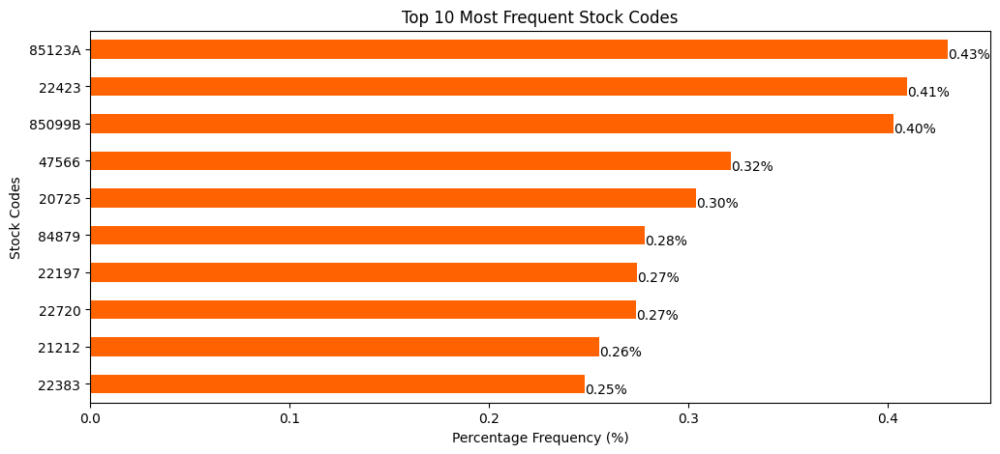

In [ ]:
# Finding the top 10 most frequent stock codes
top_10_stock_codes = cust_df['StockCode'].value_counts(normalize=True).head(10) * 100

# Plotting the top 10 most frequent stock codes
plt.figure(figsize=(12, 5))
top_10_stock_codes.plot(kind='barh', color='#ff6200')

# Adding the percentage frequency on the bars
for index, value in enumerate(top_10_stock_codes):
    plt.text(value, index+0.25, f'{value:.2f}%', fontsize=10)

plt.title('Top 10 Most Frequent Stock Codes')
plt.xlabel('Percentage Frequency (%)')
plt.ylabel('Stock Codes')
plt.gca().invert_yaxis()
plt.show()

* Product Variety: The dataset contains 3925 unique stock codes, indicating a substantial variety of products available in the online retail store. This diversity can potentially lead to the identification of distinct customer clusters, with preferences for different types of products.

* Popular Items: A closer look at the top 10 most frequent stock codes can offer insights into the popular products or categories that are frequently purchased by customers.

* Stock Code Anomalies: We observe that while most stock codes are composed of 5 or 6 characters, there are some anomalies like the code 'POST'. These anomalies might represent services or non-product transactions (perhaps postage fees) rather than actual products. To maintain the focus of the project, which is clustering based on product purchases and creating a recommendation system, these anomalies should be further investigated and possibly treated appropriately to ensure data integrity.

*To delve deeper into identifying these anomalies, let's explore the frequency of the number of numeric characters in the stock codes, which can provide insights into the nature of these unusual entries:*

In [ ]:
# Finding the number of numeric characters in each unique stock code
unique_stock_codes = cust_df['StockCode'].unique()
numeric_char_counts_in_unique_codes = pd.Series(unique_stock_codes).apply(lambda x: sum(c.isdigit() for c in str(x))).value_counts()

# Printing the value counts for unique stock codes
print("Value counts of numeric character frequencies in unique stock codes:")
print("-"*70)
print(numeric_char_counts_in_unique_codes)

Value counts of numeric character frequencies in unique stock codes:
----------------------------------------------------------------------
5    3931
0      13
4       8
6       5
1       1
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


The output indicates the following:

A majority of the unique stock codes (3903 out of 3925) contain exactly 5 numeric characters, which seems to be the standard format for representing product codes in this dataset.

There are a few anomalies: 11 stock codes contain no numeric characters and 1 stock code contains only 1 numeric character. These are clearly deviating from the standard format and need further investigation to understand their nature and whether they represent valid product transactions.

Now, let's identify the stock codes that contain 0 or 1 numeric characters to further understand these anomalies:

In [ ]:
# Finding and printing the stock codes with 0 and 1 numeric characters
anomalous_stock_codes = [code for code in unique_stock_codes if sum(c.isdigit() for c in str(code)) in (0, 1)]

# Printing each stock code on a new line
print("Anomalous stock codes:")
print("-"*22)
for code in anomalous_stock_codes:
    print(code)

Anomalous stock codes:
----------------------
POST
D
C2
DOT
M
BANK CHARGES
S
AMAZONFEE
m
DCGSSBOY
DCGSSGIRL
PADS
B
CRUK


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Let's calculate the percentage of records with these anomalous stock codes:

In [ ]:
# Calculating the percentage of records with these stock codes
percentage_anomalous = (cust_df['StockCode'].isin(anomalous_stock_codes).sum() / len(cust_df)) * 100

# Printing the percentage
print(f"The percentage of records with anomalous stock codes in the dataset is: {percentage_anomalous:.2f}%")

The percentage of records with anomalous stock codes in the dataset is: 0.55%


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Based on the analysis, we find that a very small proportion of the records, 0.45%, have anomalous stock codes, which deviate from the typical format observed in the majority of the data. Also, these anomalous codes are just a fraction among all unique stock codes (only 12 out of 3684).

These codes seem to represent non-product transactions like "BANK CHARGES", "POST" (possibly postage fees), etc. Since they do not represent actual products and are a very small proportion of the dataset, including them in the analysis might introduce noise and distort the clustering and recommendation system.

Thus, the strategy would be to filter out and remove rows with these anomalous stock codes from the dataset since our aim is to cluster customers based on their product purchasing behaviors and develop a product recommendation system, it would be prudent to exclude these records with anomalous stock codes from the dataset. This way, the focus remains strictly on genuine product transactions, which would lead to a more accurate and meaningful analysis.

In [ ]:
# Removing rows with anomalous stock codes from the dataset
cust_df = cust_df[~cust_df['StockCode'].isin(anomalous_stock_codes)]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### **6. Cleaning Description Column**

First, I will calculate the occurrence count of each unique description in the dataset. Then, I will plot the top 30 descriptions. This visualization will give a clear view of the highest occurring descriptions in the dataset:


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


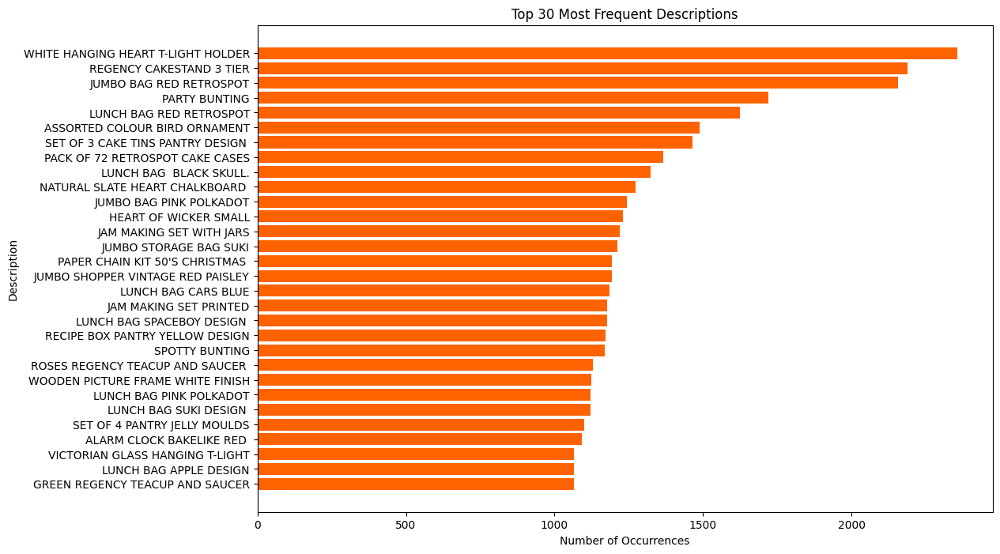

In [ ]:
# Calculate the occurrence of each unique description and sort them
description_counts = cust_df['Description'].value_counts()

# Get the top 30 descriptions
top_30_descriptions = description_counts[:30]

# Plotting
plt.figure(figsize=(12,8))
plt.barh(top_30_descriptions.index[::-1], top_30_descriptions.values[::-1], color='#ff6200')

# Adding labels and title
plt.xlabel('Number of Occurrences')
plt.ylabel('Description')
plt.title('Top 30 Most Frequent Descriptions')

# Show the plot
plt.show()

The most frequent descriptions are generally household items, particularly those associated with kitchenware, lunch bags, and decorative items.

Interestingly, all the descriptions are in uppercase, which might be a standardized format for entering product descriptions in the database. However, considering the inconsistencies and anomalies encountered in the dataset so far, it would be prudent to check if there are descriptions entered in lowercase or a mix of case styles.|

In [ ]:
# Find unique descriptions containing lowercase characters
lowercase_descriptions = cust_df['Description'].unique()
lowercase_descriptions = [desc for desc in lowercase_descriptions if any(char.islower() for char in desc)]

# Print the unique descriptions containing lowercase characters
print("The unique descriptions containing lowercase characters are:")
print("-"*60)
for desc in lowercase_descriptions:
    print(desc)

# Print the count of unique descriptions containing lowercase characters
print("\nCount of unique descriptions containing lowercase characters:", len(lowercase_descriptions))

The unique descriptions containing lowercase characters are:
------------------------------------------------------------
BAG 500g SWIRLY MARBLES
POLYESTER FILLER PAD 45x45cm
BAG 125g SWIRLY MARBLES
BAG 250g SWIRLY MARBLES
POLYESTER FILLER PAD 45x30cm
POLYESTER FILLER PAD 40x40cm
FRENCH BLUE METAL DOOR SIGN No
Dr. Jam's Arouzer Stress Ball
3 TRADITIONAl BISCUIT CUTTERS  SET
NUMBER TILE COTTAGE GARDEN No
amazon
FOLK ART GREETING CARD,pack/12
ESSENTIAL BALM 3.5g TIN IN ENVELOPE
POLYESTER FILLER PAD 65CMx65CM
check
damages
Dad's Cab Electronic Meter
NUMBER TILE VINTAGE FONT No 
*Boombox Ipod Classic
faulty
Dotcom sales
amazon sales
*USB Office Mirror Ball
POLYESTER FILLER PAD 30CMx30CM
Dotcomgiftshop Gift Voucher £40.00
Found
Dotcomgiftshop Gift Voucher £50.00
reverse 21/5/10 adjustment
Dotcomgiftshop Gift Voucher £30.00
Dotcomgiftshop Gift Voucher £20.00
mouldy, thrown away.
found
counted
Given away
Dotcom
label mix up
samples/damages
thrown away
incorrectly made-thrown away.
showroom
Ad

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# List of descriptions that make sense and should not be dropped
keep_descriptions = [
    'BAG 500g SWIRLY MARBLES',
    'POLYESTER FILLER PAD 45x45cm',
    'BAG 125g SWIRLY MARBLES',
    'BAG 250g SWIRLY MARBLES',
    'POLYESTER FILLER PAD 45x30cm',
    'POLYESTER FILLER PAD 40x40cm',
    'FRENCH BLUE METAL DOOR SIGN No',
    "Dr. Jam's Arouzer Stress Ball",
    '3 TRADITIONAl BISCUIT CUTTERS  SET',
    'FOLK ART GREETING CARD,pack/12',
    'ESSENTIAL BALM 3.5g TIN IN ENVELOPE',
    'POLYESTER FILLER PAD 65CMx65CM',
    'Dad\'s Cab Electronic Meter',
    'NUMBER TILE VINTAGE FONT No',
    '*Boombox Ipod Classic',
    'NUMBER TILE COTTAGE GARDEN No',
    '*USB Office Mirror Ball',
    'POLYESTER FILLER PAD 30CMx30CM',
    'Dotcomgiftshop Gift Voucher £40.00',
    'Dotcomgiftshop Gift Voucher £50.00',
    'Dotcomgiftshop Gift Voucher £30.00',
    'Dotcomgiftshop Gift Voucher £20.00',
    'Dotcomgiftshop Gift Voucher £10.00',
    'THE KING GIFT BAG 25x24x12cm',
    'Dotcomgiftshop Gift Voucher £100.00',
    'FLOWERS HANDBAG blue and orange'
]

# Filter and drop the rows with descriptions that don't make sense
cust_df = cust_df[~cust_df['Description'].isin(lowercase_descriptions) | cust_df['Description'].isin(keep_descriptions)]

# Print the shape of the dataframe after dropping
print(f"Shape of the dataframe after dropping descriptions with lowercase characters: {cust_df.shape}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Shape of the dataframe after dropping descriptions with lowercase characters: (531572, 9)


### **7. Treating Zero Unit Prices**

In [ ]:
cust_df['UnitPrice'].describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    531572.000000
mean          3.288899
std           4.512862
min           0.000000
25%           1.250000
50%           2.080000
75%           4.130000
max         649.500000
Name: UnitPrice, dtype: float64

In [ ]:
cust_df[cust_df['UnitPrice']<=0].describe()[['Quantity']]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Quantity
count,477.000000
mean,23.526205
std,631.174437
min,-1060.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,12540.000000


In [ ]:
# Removing records with a unit price of zero to avoid potential data entry errors
cust_df = cust_df[cust_df['UnitPrice'] > 0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### **8. Cleaning Country Anomalies**

In [ ]:
# Count the number of occurrences of 'unspecified' in the 'Country' column
unspecified_count = (cust_df['Country'] == 'Unspecified').sum()

print("Number of 'Unspecified' countries:", unspecified_count)

Number of 'Unspecified' countries: 442


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Drop rows where the country is 'unspecified' from the original DataFrame 'cust_df'
cust_df.drop(cust_df[cust_df['Country'] == 'Unspecified'].index, inplace=True)

# Print the shape of the cleaned DataFrame to verify the number of rows removed
print("Shape of cleaned DataFrame:", cust_df.shape)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Shape of cleaned DataFrame: (530653, 9)


### **9. Date-Time**

In [ ]:
# Convert 'InvoiceDate' column to datetime
cust_df['InvoiceDate'] = pd.to_datetime(cust_df['InvoiceDate'])

# Extract additional features
cust_df['DayOfWeek'] = cust_df['InvoiceDate'].dt.dayofweek
cust_df['Month'] = cust_df['InvoiceDate'].dt.month
cust_df['DayOfMonth'] = cust_df['InvoiceDate'].dt.day
cust_df['Year'] = cust_df['InvoiceDate'].dt.year

# Extract day of the week and hour from InvoiceDate
cust_df['Day_Name'] = cust_df['InvoiceDate'].dt.day_name()
cust_df['Hour'] = cust_df['InvoiceDate'].dt.hour

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
cust_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Transaction_Status,DayOfWeek,Month,DayOfMonth,Year,Day_Name,Hour
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,1785,United Kingdom,Completed,2,12,1,2010,Wednesday,8
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,1785,United Kingdom,Completed,2,12,1,2010,Wednesday,8
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,1785,United Kingdom,Completed,2,12,1,2010,Wednesday,8
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,1785,United Kingdom,Completed,2,12,1,2010,Wednesday,8
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,1785,United Kingdom,Completed,2,12,1,2010,Wednesday,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,1268,France,Completed,4,12,9,2011,Friday,12
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,1268,France,Completed,4,12,9,2011,Friday,12
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,1268,France,Completed,4,12,9,2011,Friday,12
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,1268,France,Completed,4,12,9,2011,Friday,12


### **10. Detecting Outliers**

In [ ]:
def detect_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column_name] < lower_bound) | (df[column_name] > upper_bound)]
    return outliers

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def outliers_length(column):
    # find q1 and q3 values
    q1, q3 = np.percentile(sorted(column), [25, 75])

    # compute IRQ
    IQR = q3 - q1

    # find lower and upper boundries
    lower = q1 - (1.5 * IQR)
    upper = q3 + (1.5 * IQR)

    LowerCond = column<lower
    UpperCond = column>upper

    Num_Outliers_Lower= len(cust_df[LowerCond])
    Num_Outliers_Upper= len(cust_df[UpperCond])

    return (Num_Outliers_Lower, Num_Outliers_Upper)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Get the column names that are of numerical data type
numerical_columns = cust_df.select_dtypes(include=['int64', 'int32', 'int16', 'int8', 'float64', 'float32']).columns.tolist()

# Display the column names
print("Numerical columns:", numerical_columns)

Numerical columns: ['Quantity', 'UnitPrice', 'DayOfWeek', 'Month', 'DayOfMonth', 'Year', 'Hour']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Outliers detection and removal for the 'Quantity' column

---

In [ ]:
fig = px.box(cust_df, x='Quantity', orientation='h')
fig.update_layout(height=450, width=700)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
lowerLen, upperLen= outliers_length(cust_df['Quantity'])
print("Number of lower outliers =", lowerLen)
print("Number of upper outliers =",upperLen)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Number of lower outliers = 1045
Number of upper outliers = 56167


In [ ]:
# Call the function to detect outliers in the 'Quantity' column
quantity_outliers = detect_outliers(cust_df, 'Quantity')

# Print the outliers
quantity_outliers

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Transaction_Status,DayOfWeek,Month,DayOfMonth,Year,Day_Name,Hour
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047,United Kingdom,Completed,2,12,1,2010,Wednesday,8
26,536370,22728,ALARM CLOCK BAKELIKE PINK,24,2010-12-01 08:45:00,3.75,12583,France,Completed,2,12,1,2010,Wednesday,8
27,536370,22727,ALARM CLOCK BAKELIKE RED,24,2010-12-01 08:45:00,3.75,12583,France,Completed,2,12,1,2010,Wednesday,8
30,536370,21883,STARS GIFT TAPE,24,2010-12-01 08:45:00,0.65,12583,France,Completed,2,12,1,2010,Wednesday,8
31,536370,10002,INFLATABLE POLITICAL GLOBE,48,2010-12-01 08:45:00,0.85,12583,France,Completed,2,12,1,2010,Wednesday,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541876,581585,84945,MULTI COLOUR SILVER T-LIGHT HOLDER,24,2011-12-09 12:31:00,0.85,15804,United Kingdom,Completed,4,12,9,2011,Friday,12
541882,581585,21916,SET 12 RETRO WHITE CHALK STICKS,24,2011-12-09 12:31:00,0.42,15804,United Kingdom,Completed,4,12,9,2011,Friday,12
541883,581585,84692,BOX OF 24 COCKTAIL PARASOLS,25,2011-12-09 12:31:00,0.42,15804,United Kingdom,Completed,4,12,9,2011,Friday,12
541891,581586,23275,SET OF 3 HANGING OWLS OLLIE BEAK,24,2011-12-09 12:49:00,1.25,13113,United Kingdom,Completed,4,12,9,2011,Friday,12


In [ ]:
# Outliers removal
threshold = 20000

print("\nDF with outliers: ", cust_df.shape)

cust_df = cust_df[cust_df['Quantity'] <= threshold]

print("\nDF without outliers: ", cust_df.shape)


DF with outliers:  (530653, 15)

DF without outliers:  (530651, 15)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
fig = px.box(cust_df, x='Quantity', orientation='h')
fig.update_layout(height=450, width=700)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Outliers detection and removal for the 'UnitPrice' column

---

In [ ]:
fig = px.box(cust_df, x='UnitPrice', orientation='h')
fig.update_layout(height=450, width=700)
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
lowerLen, upperLen= outliers_length(cust_df['UnitPrice'])
print("Number of lower outliers =", lowerLen)
print("Number of upper outliers =",upperLen)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Number of lower outliers = 0
Number of upper outliers = 36853


In [ ]:
# Outliers removal
threshold = 250

print("\nDF with outliers: ", cust_df.shape)

cust_df = cust_df[cust_df['UnitPrice'] <= threshold]

print("\nDF without outliers: ", cust_df.shape)


DF with outliers:  (530651, 15)

DF without outliers:  (530638, 15)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **EDA:**

In [ ]:
cust_df.describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Quantity,InvoiceDate,UnitPrice,DayOfWeek,Month,DayOfMonth,Year,Hour
count,530638.000000,530638,530638.000000,530638.000000,530638.000000,530638.000000,530638.000000,530638.000000
mean,9.672285,2011-07-04 12:46:21.993524480,3.283920,2.426937,7.550283,15.015495,2010.921773,13.075669
min,-80995.000000,2010-12-01 08:26:00,0.030000,0.000000,1.000000,1.000000,2010.000000,6.000000
25%,1.000000,2011-03-28 10:52:00,1.250000,1.000000,5.000000,7.000000,2011.000000,11.000000
50%,3.000000,2011-07-19 17:17:00,2.080000,2.000000,8.000000,15.000000,2011.000000,13.000000
75%,10.000000,2011-10-19 10:34:00,4.130000,4.000000,11.000000,22.000000,2011.000000,15.000000
max,4800.000000,2011-12-09 12:50:00,195.000000,6.000000,12.000000,31.000000,2011.000000,20.000000
std,156.223402,NaN,4.132519,1.842917,3.509719,8.659304,0.268528,2.447515


In [ ]:
country_frequencies = cust_df['Country'].value_counts()

# Print the frequencies of countries
print("Frequencies of Countries:")
print(country_frequencies)

Frequencies of Countries:
Country
United Kingdom          486076
Germany                   9079
France                    8218
EIRE                      8059
Spain                     2462
Netherlands               2326
Belgium                   1971
Switzerland               1960
Portugal                  1466
Australia                 1253
Norway                    1059
Italy                      783
Channel Islands            752
Finland                    653
Cyprus                     608
Sweden                     436
Austria                    387
Denmark                    375
Japan                      355
Poland                     336
Israel                     294
USA                        291
Hong Kong                  276
Singapore                  215
Iceland                    182
Canada                     150
Greece                     142
Malta                      123
United Arab Emirates        67
European Community          58
RSA                         57
Leban

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



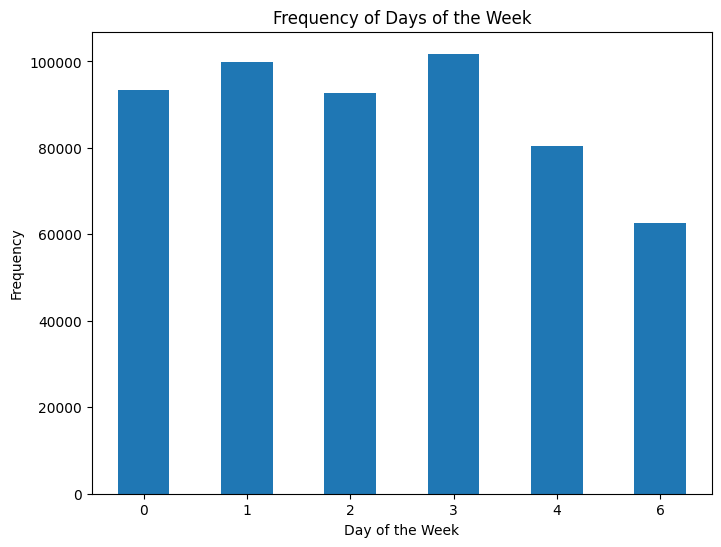

In [ ]:
# Generate bar plot for 'DayOfWeek'
plt.figure(figsize=(8, 6))
cust_df['DayOfWeek'].value_counts().sort_index().plot(kind='bar')
plt.title('Frequency of Days of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Frequency')
plt.xticks(rotation=0)  # Reset x-axis labels rotation
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-65-88b5d2d68fa2>:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




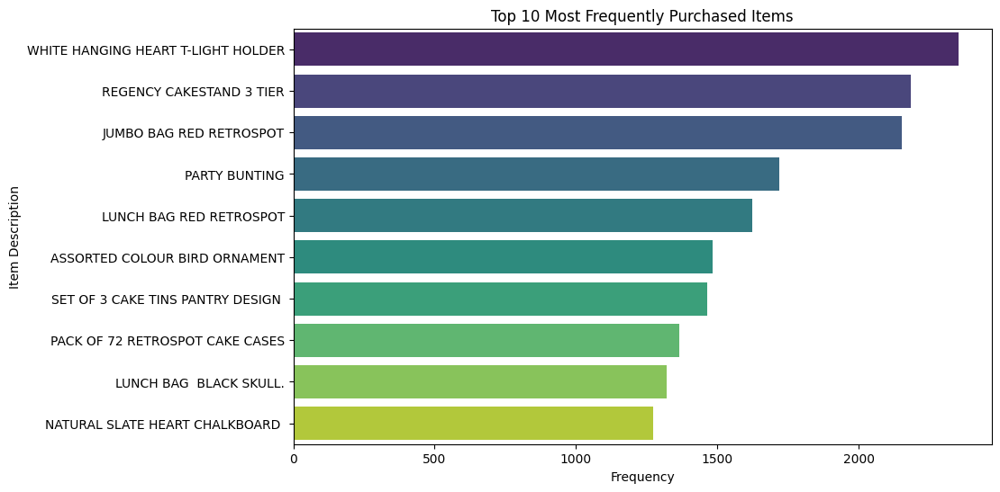

In [ ]:
# Calculate the frequency of each item
item_counts = cust_df['Description'].value_counts()

# Choose the number of top items to visualize
top_n = 10

# Select the top N most frequently purchased items
top_items = item_counts.head(top_n)

# Create a horizontal bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=top_items.values, y=top_items.index, palette='viridis')
plt.title(f'Top {top_n} Most Frequently Purchased Items')
plt.xlabel('Frequency')
plt.ylabel('Item Description')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-66-b32020cc633f>:15: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




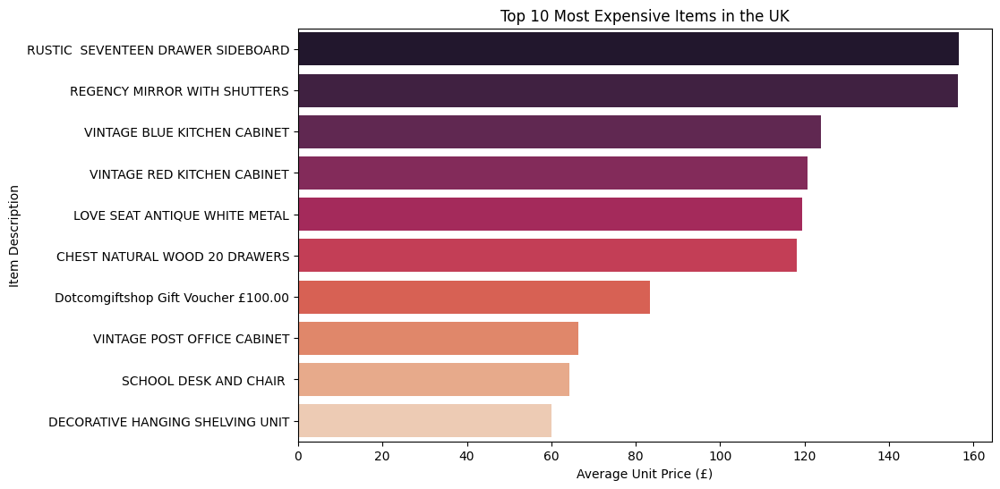

In [ ]:
# Filter the dataset for transactions in the UK
uk_transactions = cust_df[cust_df['Country'] == 'United Kingdom']

# Calculate the average unit price for each item
item_avg_prices = uk_transactions.groupby('Description')['UnitPrice'].mean().sort_values(ascending=False)

# Choose the number of top items to visualize
top_n = 10

# Select the top N most expensive items
top_expensive_items = item_avg_prices.head(top_n)

# Create a horizontal bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=top_expensive_items.values, y=top_expensive_items.index, palette='rocket')
plt.title(f'Top {top_n} Most Expensive Items in the UK')
plt.xlabel('Average Unit Price (£)')
plt.ylabel('Item Description')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-67-84a4cc2cde54>:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




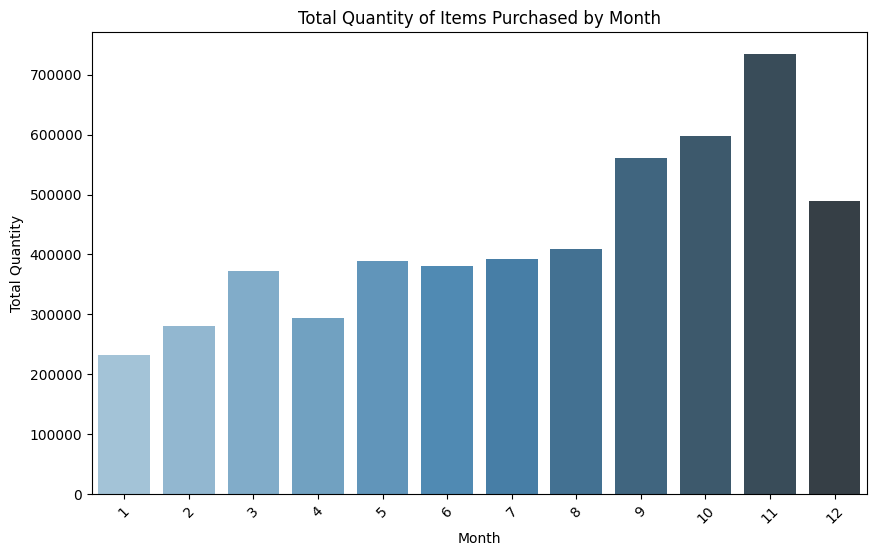

In [ ]:
# Extract month from 'InvoiceDate' and create a new column
cust_df['Month'] = cust_df['InvoiceDate'].dt.month

# Calculate the total quantity of items purchased in each month
monthly_quantity = cust_df.groupby('Month')['Quantity'].sum()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=monthly_quantity.index, y=monthly_quantity.values, palette='Blues_d')
plt.title('Total Quantity of Items Purchased by Month')
plt.xlabel('Month')
plt.ylabel('Total Quantity')
plt.xticks(rotation=45)
plt.show()

In [ ]:
fig_quantity = px.scatter(cust_df, x='DayOfWeek', y='Quantity', title='Quantity vs Day of the Week',
                          labels={'Quantity': 'Quantity', 'DayOfWeek': 'Day of the Week'},
                          category_orders={'DayOfWeek': [1, 2, 3, 4, 5, 6, 7]},
                          width=800, height=600)
fig_quantity.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Calculate country frequencies
country_frequencies = cust_df['Country'].value_counts().reset_index()
country_frequencies.columns = ['Country', 'Count']

# Create treemap with custom size
fig_treemap = px.treemap(country_frequencies, path=['Country'], values='Count',
                         title='Treemap of Country Frequencies',
                         width=1000, height=600)
fig_treemap.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-70-88b5d2d68fa2>:12: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




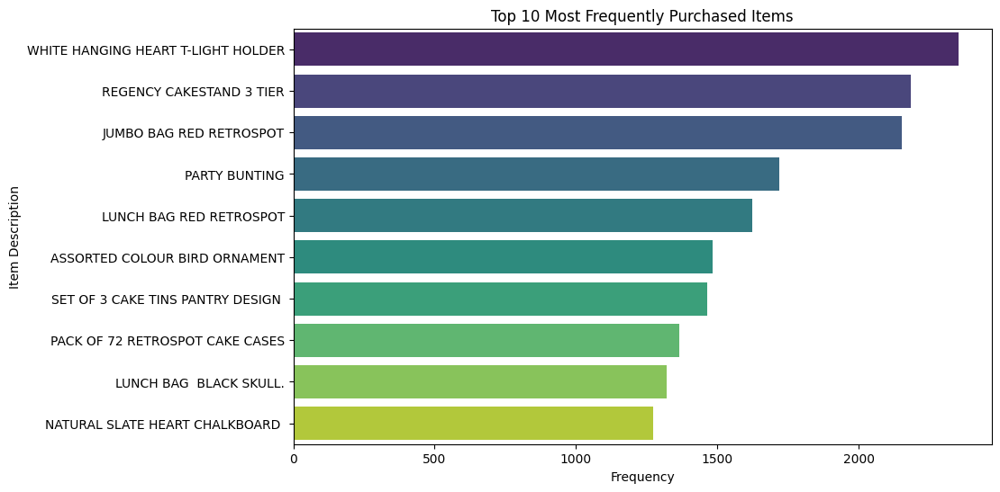

In [ ]:
# Calculate the frequency of each item
item_counts = cust_df['Description'].value_counts()

# Choose the number of top items to visualize
top_n = 10

# Select the top N most frequently purchased items
top_items = item_counts.head(top_n)

# Create a horizontal bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=top_items.values, y=top_items.index, palette='viridis')
plt.title(f'Top {top_n} Most Frequently Purchased Items')
plt.xlabel('Frequency')
plt.ylabel('Item Description')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



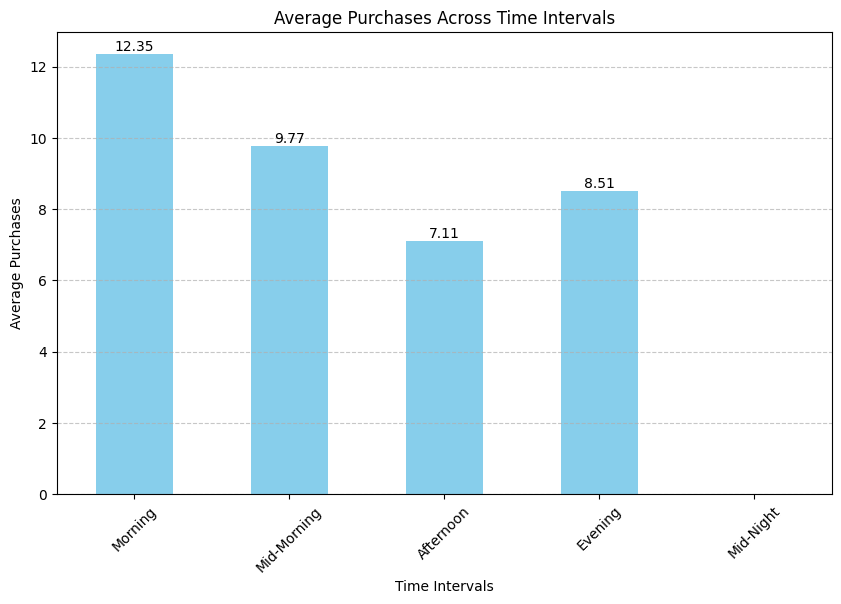

In [ ]:
# Define time intervals
time_intervals = {
    'Morning': range(6, 12),
    'Mid-Morning': range(12, 15),
    'Afternoon': range(15, 18),
    'Evening': range(18, 23),
    'Mid-Night': range(24, 6)
}

# Bin purchases into time intervals
for interval, hours in time_intervals.items():
    cust_df.loc[cust_df['Hour'].isin(hours), 'Time Interval'] = interval

# Group by time intervals and calculate average purchases
average_purchases = cust_df.groupby('Time Interval')['Quantity'].mean()

# Define the order of time intervals for sorting
time_interval_order = [
    'Morning',
    'Mid-Morning',
    'Afternoon',
    'Evening',
    'Mid-Night'
]

# Sort the time intervals based on the defined order
average_purchases = average_purchases.reindex(time_interval_order)

# Plot the average purchases
plt.figure(figsize=(10, 6))
average_purchases.plot(kind='bar', color='skyblue')
plt.title('Average Purchases Across Time Intervals')
plt.xlabel('Time Intervals')
plt.ylabel('Average Purchases')

# Add annotations
for i, val in enumerate(average_purchases):
    plt.text(i, val, f'{val:.2f}', ha='center', va='bottom')

plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



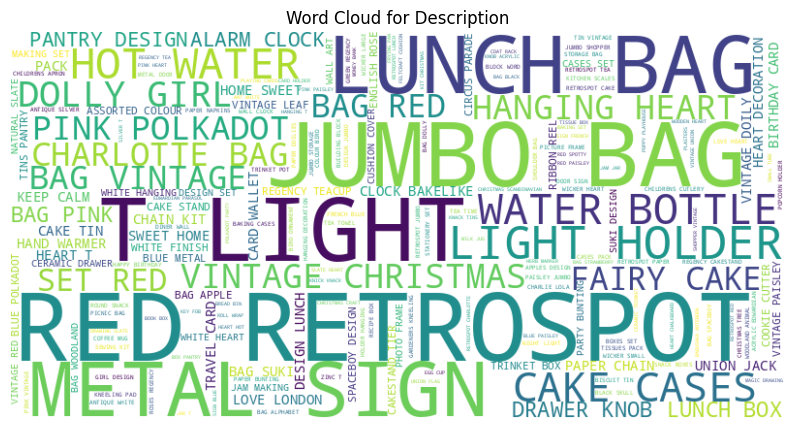

In [ ]:
# Concatenate all descriptions into a single string
text = ' '.join(cust_df['Description'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for Description')
plt.axis('off')
plt.show()

In [ ]:
# Group by country and count the number of customers
customers_per_country = cust_df.groupby('Country').size().reset_index(name='Number of Customers')

# Create choropleth map with custom size
fig = px.choropleth(customers_per_country,
                    locations="Country",
                    locationmode='country names',
                    color="Number of Customers",
                    hover_name="Country",
                    color_continuous_scale="Viridis",
                    title="Number of Customers by Country",
                    width=800, height=600)

fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **RFM Analysis:**
---

* **Recency: How recent was the customer's last purchase?**

 Customers who recently made a purchase will still have the product on their mind and are more likely to purchase or use the product again. Businesses often measure recency in days. But, depending on the product, they may measure it in years, weeks or even hours.


* **Frequency: How often did this customer make a purchase in a given period?**

 Customers who purchased once are often more likely to purchase again. Additionally, first time customers may be good targets for follow-up advertising to convert them into more frequent customers.


* **Monetary: How much money did the customer spend in a given period?**

 Customers who spend a lot of money are more likely to spend money in the future and have a high value to a business.

In [ ]:
# Group by CustomerID and aggregate StockCodes into lists
transactions = cust_df.groupby('CustomerID')['StockCode'].apply(list).reset_index()
transactions

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209..."
1,1004,"[84828, 22171, 22173]"
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2..."
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21..."
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213..."
...,...,...
5596,998,"[20675, 20677, 20719, 20723, 20724, 20724, 207..."
5597,9984,"[23052, 23089, 23123, 23182, 23199, 23202, 232..."
5598,9987,"[20669, 20685, 20700, 20707, 20719, 20724, 207..."
5599,9989,"[15058A, 17012A, 17012C, 20663, 20707, 20717, ..."


### **Recency**

In [ ]:
# Find the most recent purchase date for each customer
customer_recency = cust_df.groupby('CustomerID')['InvoiceDate'].max().reset_index()

# Find the most recent date in the entire dataset
most_recent_date = customer_recency['InvoiceDate'].max()

# Calculate the number of days since the last purchase for each customer
customer_recency['Recency'] = (most_recent_date - customer_recency['InvoiceDate']).dt.days

# Remove the InvoiceDate column if you don't need it anymore
customer_recency.drop(columns=['InvoiceDate'], inplace=True)

# Merge the recency information into the transactions DataFrame based on CustomerID
transactions = pd.merge(transactions, customer_recency, on='CustomerID', how='left')
transactions

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209...",99
1,1004,"[84828, 22171, 22173]",307
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2...",51
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21...",28
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213...",92
...,...,...,...
5596,998,"[20675, 20677, 20719, 20723, 20724, 20724, 207...",28
5597,9984,"[23052, 23089, 23123, 23182, 23199, 23202, 232...",118
5598,9987,"[20669, 20685, 20700, 20707, 20719, 20724, 207...",141
5599,9989,"[15058A, 17012A, 17012C, 20663, 20707, 20717, ...",259


### **Frequency**



In [ ]:
# Calculate the total number of transactions made by each customer
frequency = cust_df.groupby('CustomerID')['InvoiceNo'].nunique().reset_index()
frequency.rename(columns={'InvoiceNo': 'Frequency'}, inplace=True)

# Calculate the total number of products purchased by each customer
total_products_purchased = cust_df.groupby('CustomerID')['Quantity'].sum().reset_index()
total_products_purchased.rename(columns={'Quantity': 'Total_Products_Purchased'}, inplace=True)

# Merge the new features into the transactions dataframe
transactions = pd.merge(transactions, frequency, on='CustomerID')
transactions = pd.merge(transactions, total_products_purchased, on='CustomerID')

# Display the first few rows of the transactions dataframe
transactions.head()
transactions

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209...",99,1,418
1,1004,"[84828, 22171, 22173]",307,1,3
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2...",51,2,317
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21...",28,1,84
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213...",92,1,410
...,...,...,...,...,...
5596,998,"[20675, 20677, 20719, 20723, 20724, 20724, 207...",28,1,923
5597,9984,"[23052, 23089, 23123, 23182, 23199, 23202, 232...",118,1,388
5598,9987,"[20669, 20685, 20700, 20707, 20719, 20724, 207...",141,1,1344
5599,9989,"[15058A, 17012A, 17012C, 20663, 20707, 20717, ...",259,1,430


### **Monetary**

In [ ]:
# Calculate the total spend by each customer
cust_df['Monetary'] = cust_df['UnitPrice'] * cust_df['Quantity']
total_spend = cust_df.groupby('CustomerID')['Monetary'].sum().reset_index()

# Calculate the average transaction value for each customer
average_transaction_value = total_spend.merge(frequency, on='CustomerID')
average_transaction_value['Average_Transaction_Value'] = average_transaction_value['Monetary'] / average_transaction_value['Frequency']

# Merge the new features into the transactions dataframe
transactions = pd.merge(transactions, total_spend, on='CustomerID')
transactions = pd.merge(transactions, average_transaction_value[['CustomerID', 'Average_Transaction_Value']], on='CustomerID')

# Display the first few rows of the transactions dataframe
transactions.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209...",99,1,418,1428.99,1428.990
1,1004,"[84828, 22171, 22173]",307,1,3,12.70,12.700
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2...",51,2,317,880.45,440.225
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21...",28,1,84,383.47,383.470
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213...",92,1,410,1540.73,1540.730


### **Product Diversity**

In [ ]:
# Calculate the number of unique products purchased by each customer
unique_products_purchased = cust_df.groupby('CustomerID')['StockCode'].nunique().reset_index()
unique_products_purchased.rename(columns={'StockCode': 'Unique_Products_Purchased'}, inplace=True)

# Merge the new feature into the transactions dataframe
transactions = pd.merge(transactions, unique_products_purchased, on='CustomerID')

# Display the first few rows of the transactions dataframe
transactions.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209...",99,1,418,1428.99,1428.990,240
1,1004,"[84828, 22171, 22173]",307,1,3,12.70,12.700,3
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2...",51,2,317,880.45,440.225,165
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21...",28,1,84,383.47,383.470,32
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213...",92,1,410,1540.73,1540.730,215


### **Additional Behavioural Features**

In [ ]:
# Convert InvoiceDate to datetime and extract only the date
cust_df['InvoiceDay'] = cust_df['InvoiceDate'].dt.date

# Calculate the average number of days between consecutive purchases
days_between_purchases = cust_df.groupby('CustomerID')['InvoiceDay'].apply(lambda x: (x.diff().dropna()).apply(lambda y: y.days))
average_days_between_purchases = days_between_purchases.groupby('CustomerID').mean().reset_index()
average_days_between_purchases.rename(columns={'InvoiceDay': 'Average_Days_Between_Purchases'}, inplace=True)

# Find the favorite shopping day of the week
favorite_shopping_day = cust_df.groupby(['CustomerID', 'DayOfWeek']).size().reset_index(name='Count')
favorite_shopping_day = favorite_shopping_day.loc[favorite_shopping_day.groupby('CustomerID')['Count'].idxmax()][['CustomerID', 'DayOfWeek']]

# Find the favorite shopping hour of the day
favorite_shopping_hour = cust_df.groupby(['CustomerID', 'Hour']).size().reset_index(name='Count')
favorite_shopping_hour = favorite_shopping_hour.loc[favorite_shopping_hour.groupby('CustomerID')['Count'].idxmax()][['CustomerID', 'Hour']]

# Merge the new features into the transactions dataframe
transactions = pd.merge(transactions, average_days_between_purchases, on='CustomerID')
transactions = pd.merge(transactions, favorite_shopping_day, on='CustomerID')
transactions = pd.merge(transactions, favorite_shopping_hour, on='CustomerID')

# Display the first few rows of the transactions dataframe
transactions.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,DayOfWeek,Hour
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209...",99,1,418,1428.99,1428.990,240,0.000000,2,15
1,1004,"[84828, 22171, 22173]",307,1,3,12.70,12.700,3,0.000000,4,16
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2...",51,2,317,880.45,440.225,165,1.262195,1,17
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21...",28,1,84,383.47,383.470,32,0.000000,3,14
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213...",92,1,410,1540.73,1540.730,215,0.000000,2,16


In [ ]:
# Rename the columns
transactions.rename(columns={'DayOfWeek': 'Favorite_Shopping_Day', 'Hour': 'Favorite_Shopping_Hour'}, inplace=True)
transactions

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209...",99,1,418,1428.99,1428.990,240,0.000000,2,15
1,1004,"[84828, 22171, 22173]",307,1,3,12.70,12.700,3,0.000000,4,16
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2...",51,2,317,880.45,440.225,165,1.262195,1,17
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21...",28,1,84,383.47,383.470,32,0.000000,3,14
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213...",92,1,410,1540.73,1540.730,215,0.000000,2,16
...,...,...,...,...,...,...,...,...,...,...,...
5345,9967,"[22361, 22364, 22378, 22379, 22381, 22385, 223...",289,1,91,461.63,461.630,48,0.000000,2,11
5346,998,"[20675, 20677, 20719, 20723, 20724, 20724, 207...",28,1,923,4365.75,4365.750,79,0.000000,4,10
5347,9984,"[23052, 23089, 23123, 23182, 23199, 23202, 232...",118,1,388,1376.08,1376.080,195,0.000000,4,16
5348,9987,"[20669, 20685, 20700, 20707, 20719, 20724, 207...",141,1,1344,2837.03,2837.030,448,0.000000,2,16


### **Geographic Features**

In [ ]:
cust_df['Country'].value_counts(normalize=True).head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Country
United Kingdom    0.916022
Germany           0.017110
France            0.015487
EIRE              0.015187
Spain             0.004640
Name: proportion, dtype: float64

In [ ]:
# Group by CustomerID and Country to get the number of transactions per country for each customer
customer_country = cust_df.groupby(['CustomerID', 'Country']).size().reset_index(name='Number_of_Transactions')

# Get the country with the maximum number of transactions for each customer (in case a customer has transactions from multiple countries)
customer_main_country = customer_country.sort_values('Number_of_Transactions', ascending=False).drop_duplicates('CustomerID')

# Create a binary column indicating whether the customer is from the UK or not
customer_main_country['Is_UK'] = customer_main_country['Country'].apply(lambda x: 1 if x == 'United Kingdom' else 0)

# Convert 'CustomerID' column in customer_main_country to int64
customer_main_country['CustomerID'] = customer_main_country['CustomerID'].astype('int64')

# Merge this data with the transactions dataframe
transactions = pd.merge(transactions, customer_main_country[['CustomerID', 'Is_UK']], on='CustomerID', how='left')

# Display the first few rows of the transactions dataframe
transactions.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,Is_UK
0,1001,"['20774', '20777', '20866', '20869', '20914', ...",99,1,418,1428.99,1428.990,240,0.000000,2,15,1428.990,0.000000,0.00,1
1,1004,"['84828', '22171', '22173']",307,1,3,12.70,12.700,3,0.000000,4,16,12.700,0.000000,0.00,1
2,1009,"['22992', '22428', '16168M', '16236', '16237',...",51,2,317,880.45,440.225,165,1.262195,1,17,440.225,600.156881,848.75,1
3,1016,"['23180', '22730', '46000M', '21629', '22727',...",28,1,84,383.47,383.470,32,0.000000,3,14,383.470,0.000000,0.00,1
4,1021,"['21261', '21263', '21314', '21352', '21356', ...",92,1,410,1540.73,1540.730,215,0.000000,2,16,1540.730,0.000000,0.00,1


In [ ]:
# Display feature distribution
transactions['Is_UK'].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Is_UK
1    4900
0     450
Name: count, dtype: int64

### **Seasonality & Trends**

In [ ]:
# Calculate monthly spending for each customer
monthly_spending = cust_df.groupby(['CustomerID', 'Year', 'Month'])['Monetary'].sum().reset_index()

# Calculate Seasonal Buying Patterns: We are using monthly frequency as a proxy for seasonal buying patterns
seasonal_buying_patterns = monthly_spending.groupby('CustomerID')['Monetary'].agg(['mean', 'std']).reset_index()
seasonal_buying_patterns.rename(columns={'mean': 'Monthly_Spending_Mean', 'std': 'Monthly_Spending_Std'}, inplace=True)

# Replace NaN values in Monthly_Spending_Std with 0, implying no variability for customers with single transaction month
seasonal_buying_patterns['Monthly_Spending_Std'].fillna(0, inplace=True)

# Calculate Trends in Spending
# We are using the slope of the linear trend line fitted to the customer's spending over time as an indicator of spending trends
def calculate_trend(spend_data):
    # If there are more than one data points, we calculate the trend using linear regression
    if len(spend_data) > 1:
        x = np.arange(len(spend_data))
        slope, _, _, _, _ = linregress(x, spend_data)
        return slope
    # If there is only one data point, no trend can be calculated, hence we return 0
    else:
        return 0

# Apply the calculate_trend function to find the spending trend for each customer
spending_trends = monthly_spending.groupby('CustomerID')['Monetary'].apply(calculate_trend).reset_index()
spending_trends.rename(columns={'Monetary': 'Spending_Trend'}, inplace=True)

# Merge the new features into the transactions dataframe
transactions = pd.merge(transactions, seasonal_buying_patterns, on='CustomerID')
transactions = pd.merge(transactions, spending_trends, on='CustomerID')

# Display the first few rows of the transactions dataframe
transactions.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend
0,1001,"[20774, 20777, 20866, 20869, 20914, 20979, 209...",99,1,418,1428.99,1428.990,240,0.000000,2,15,1428.990,0.000000,0.00
1,1004,"[84828, 22171, 22173]",307,1,3,12.70,12.700,3,0.000000,4,16,12.700,0.000000,0.00
2,1009,"[22992, 22428, 16168M, 16236, 16237, 16258A, 2...",51,2,317,880.45,440.225,165,1.262195,1,17,440.225,600.156881,848.75
3,1016,"[23180, 22730, 46000M, 21629, 22727, 22807, 21...",28,1,84,383.47,383.470,32,0.000000,3,14,383.470,0.000000,0.00
4,1021,"[21261, 21263, 21314, 21352, 21356, 21380, 213...",92,1,410,1540.73,1540.730,215,0.000000,2,16,1540.730,0.000000,0.00


In [ ]:
# Changing the data type of 'CustomerID' to string as it is a unique identifier and not used in mathematical operations
transactions['CustomerID'] = transactions['CustomerID'].astype(str)

# Convert data types of columns to optimal types
transactions = transactions.convert_dtypes()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5350 entries, 0 to 5349
Data columns (total 14 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   CustomerID                      5350 non-null   string 
 1   StockCode                       5350 non-null   object 
 2   Recency                         5350 non-null   Int64  
 3   Frequency                       5350 non-null   Int64  
 4   Total_Products_Purchased        5350 non-null   Int64  
 5   Monetary                        5350 non-null   Float64
 6   Average_Transaction_Value       5350 non-null   Float64
 7   Unique_Products_Purchased       5350 non-null   Int64  
 8   Average_Days_Between_Purchases  5350 non-null   Float64
 9   Favorite_Shopping_Day           5350 non-null   Int32  
 10  Favorite_Shopping_Hour          5350 non-null   Int32  
 11  Monthly_Spending_Mean           5350 non-null   Float64
 12  Monthly_Spending_Std            53

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Save the transaction dataset to a CSV file
transactions.to_csv('transactions.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Customer Dataset Description**

| Variable                          | Description                                                                                                              |
|-----------------------------------|--------------------------------------------------------------------------------------------------------------------------|
| CustomerID                        | Identifier uniquely assigned to each customer, used to distinguish individual customers.                                  |
| Recency          | The number of days that have passed since the customer's last purchase.                                                   |
| Frecuency                | The total number of transactions made by the customer.                                                                   |
| Total_Products_Purchased          | The total quantity of products purchased by the customer across all transactions.                                         |
| Monetary                       | The total amount of money the customer has spent across all transactions.                                                 |
| Average_Transaction_Value         | The average value of the customer's transactions, calculated as total spend divided by the number of transactions.        |
| Unique_Products_Purchased         | The number of different products the customer has purchased.
| Average_Days_Between_Purchases         | The average number of days between consecutive purchases made by the customer.                                                               |
| Favorite_Shopping_Day                      | The day of the week when the customer prefers to shop, represented numerically (0 for Monday, 6 for Sunday).               |
| Favorite_Shopping_Hour                              | The hour of the day when the customer prefers to shop, represented in a 24-hour format.                                   |
| Is_UK                             | A binary variable indicating whether the customer is based in the UK (1) or not (0).                                                      |
| Monthly_Spending_Mean             | The average monthly spending of the customer.                                                                            |
| Monthly_Spending_Std              | The standard deviation of the customer's monthly spending, indicating the variability in their spending pattern.          |
| Spending_Trend                    | A numerical representation of the trend in the customer's spending over time. A positive value indicates an increasing trend, a negative value indicates a decreasing trend, and a value close to zero indicates a stable trend. |


### **Outlier Detection**

In [ ]:
transactions = pd.read_csv('/content/drive/MyDrive/transactions.csv')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Initializing the IsolationForest model with a contamination parameter of 0.05
model = IsolationForest(contamination=0.05, random_state=0)

# Fitting the model on our dataset (excluding 'CustomerID' and 'StockCode')
transactions['Outlier_Scores'] = model.fit_predict(transactions.drop(columns=['CustomerID', 'StockCode']).to_numpy())

# Creating a new column to identify outliers (1 for inliers and -1 for outliers)
transactions['Is_Outlier'] = [1 if x == -1 else 0 for x in transactions['Outlier_Scores']]

# Display the first few rows of the transactions dataframe
transactions.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Mean,Monthly_Spending_Std,Spending_Trend,Is_UK,Outlier_Scores,Is_Outlier
0,1001,"['20774', '20777', '20866', '20869', '20914', ...",99,1,418,1428.99,1428.990,240,0.000000,2,15,1428.990,0.000000,0.00,1,1,0
1,1004,"['84828', '22171', '22173']",307,1,3,12.70,12.700,3,0.000000,4,16,12.700,0.000000,0.00,1,1,0
2,1009,"['22992', '22428', '16168M', '16236', '16237',...",51,2,317,880.45,440.225,165,1.262195,1,17,440.225,600.156881,848.75,1,1,0
3,1016,"['23180', '22730', '46000M', '21629', '22727',...",28,1,84,383.47,383.470,32,0.000000,3,14,383.470,0.000000,0.00,1,1,0
4,1021,"['21261', '21263', '21314', '21352', '21356', ...",92,1,410,1540.73,1540.730,215,0.000000,2,16,1540.730,0.000000,0.00,1,1,0


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



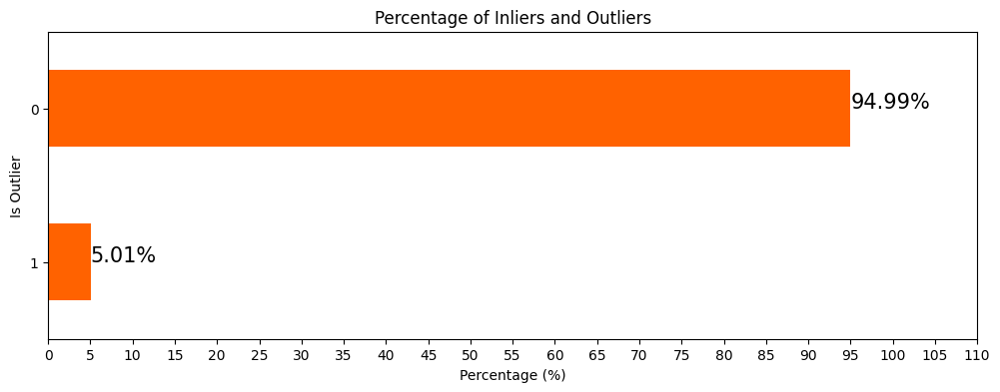

In [ ]:
# Calculate the percentage of inliers and outliers
outlier_percentage = transactions['Is_Outlier'].value_counts(normalize=True) * 100

# Plotting the percentage of inliers and outliers
plt.figure(figsize=(12, 4))
outlier_percentage.plot(kind='barh', color='#ff6200')

# Adding the percentage labels on the bars
for index, value in enumerate(outlier_percentage):
    plt.text(value, index, f'{value:.2f}%', fontsize=15)

plt.title('Percentage of Inliers and Outliers')
plt.xticks(ticks=np.arange(0, 115, 5))
plt.xlabel('Percentage (%)')
plt.ylabel('Is Outlier')
plt.gca().invert_yaxis()
plt.show()

In [ ]:
# Separate the outliers for analysis
outliers_data = transactions[transactions['Is_Outlier'] == 1]

# Remove the outliers from the main dataset
transactions_cleaned = transactions[transactions['Is_Outlier'] == 0]

# Drop the 'Outlier_Scores' and 'Is_Outlier' columns
transactions_cleaned = transactions_cleaned.drop(columns=['Outlier_Scores', 'Is_Outlier'])

# Reset the index of the cleaned data
transactions_cleaned.reset_index(drop=True, inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Save the cleaned dataset to a CSV file
transactions_cleaned.to_csv('transactions_cleaned.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



Previously we dropped from the orriginal data set

### **Correlation Analysis**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



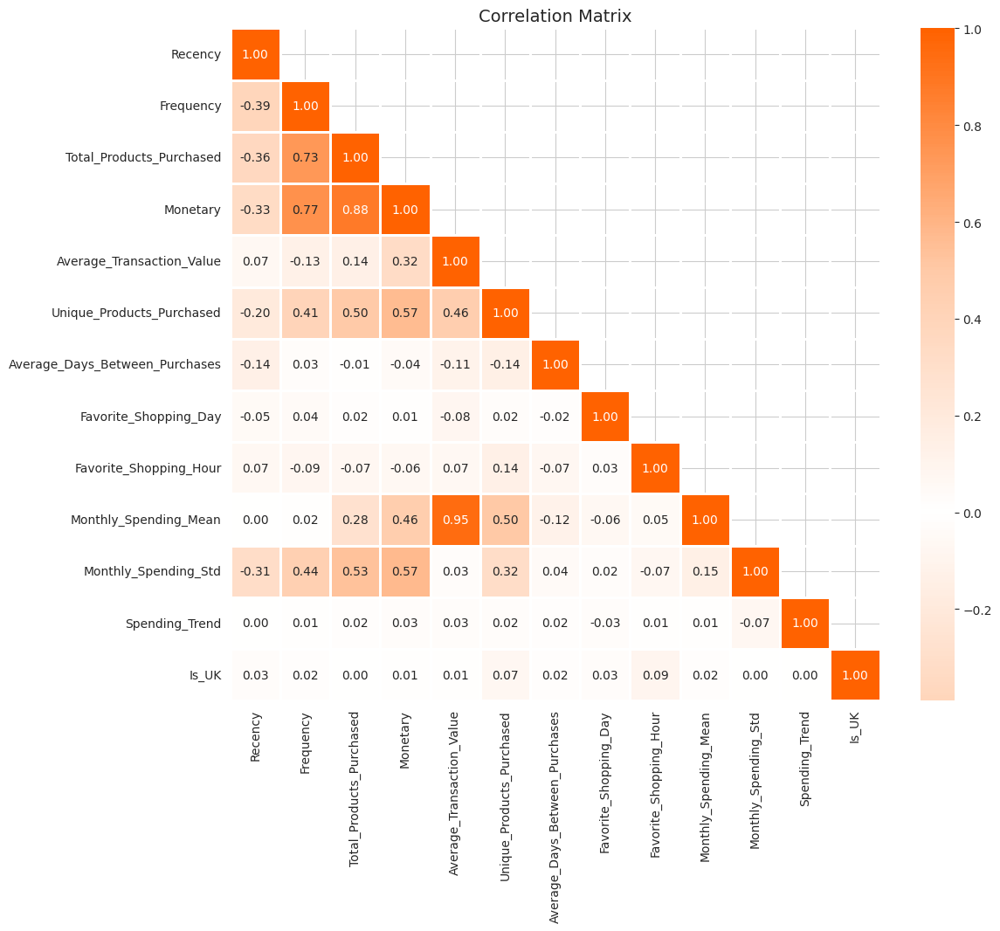

In [ ]:
# Reset background style
sns.set_style('whitegrid')

# Calculate the correlation matrix excluding the 'CustomerID' column
corr = transactions_cleaned.drop(columns=['CustomerID', 'StockCode']).corr()

# Define a custom colormap
colors = ['#ff6200', '#ffcaa8', 'white', '#ffcaa8', '#ff6200']
my_cmap = LinearSegmentedColormap.from_list('custom_map', colors, N=256)

# Create a mask to only show the lower triangle of the matrix (since it's mirrored around its
# top-left to bottom-right diagonal)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr, mask=mask, cmap=my_cmap, annot=True, center=0, fmt='.2f', linewidths=2)
plt.title('Correlation Matrix', fontsize=14)
plt.show()

In [ ]:
# We will be removing the features that exceed the threshold, in our case the threshold is 0.8.
transactions_cleaned.drop(columns=['Monthly_Spending_Mean'], inplace=True)
transactions_cleaned

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Std,Spending_Trend,Is_UK
0,1001,"['20774', '20777', '20866', '20869', '20914', ...",99,1,418,1428.99,1428.990,240,0.000000,2,15,0.000000,0.00,1
1,1004,"['84828', '22171', '22173']",307,1,3,12.70,12.700,3,0.000000,4,16,0.000000,0.00,1
2,1009,"['22992', '22428', '16168M', '16236', '16237',...",51,2,317,880.45,440.225,165,1.262195,1,17,600.156881,848.75,1
3,1016,"['23180', '22730', '46000M', '21629', '22727',...",28,1,84,383.47,383.470,32,0.000000,3,14,0.000000,0.00,1
4,1021,"['21261', '21263', '21314', '21352', '21356', ...",92,1,410,1540.73,1540.730,215,0.000000,2,16,0.000000,0.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5077,9967,"['22361', '22364', '22378', '22379', '22381', ...",289,1,91,461.63,461.630,48,0.000000,2,11,0.000000,0.00,1
5078,998,"['20675', '20677', '20719', '20723', '20724', ...",28,1,923,4365.75,4365.750,79,0.000000,4,10,0.000000,0.00,1
5079,9984,"['23052', '23089', '23123', '23182', '23199', ...",118,1,388,1376.08,1376.080,195,0.000000,4,16,0.000000,0.00,1
5080,9987,"['20669', '20685', '20700', '20707', '20719', ...",141,1,1344,2837.03,2837.030,448,0.000000,2,16,0.000000,0.00,1


### **Feature Scaling**

In [ ]:
transactions_cleaned.describe()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Std,Spending_Trend,Is_UK
count,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000,5082.000000
mean,12239.781976,109.291814,3.688115,617.074183,1116.751602,377.757986,62.780795,2.662185,2.462220,12.723337,113.156930,-11.329534,0.925620
std,5463.349078,107.482421,4.609375,874.246616,1447.968399,472.808793,71.486260,8.201569,1.807681,2.396654,190.678016,200.889479,0.262414
min,2.000000,0.000000,1.000000,-595.000000,-1208.040000,-1208.040000,1.000000,0.000000,0.000000,7.000000,0.000000,-2420.380000,0.000000
25%,8804.500000,21.000000,1.000000,119.000000,254.895000,144.896250,15.000000,0.000000,1.000000,11.000000,0.000000,-8.498750,1.000000
50%,14223.500000,64.000000,2.000000,314.500000,602.800000,241.975238,37.000000,0.597947,2.000000,13.000000,18.227024,0.000000,1.000000
75%,16235.750000,184.000000,4.000000,738.000000,1432.012500,403.276250,82.000000,2.549636,4.000000,15.000000,160.362047,1.523392,1.000000
max,18287.000000,373.000000,57.000000,10154.000000,15462.340000,4839.420000,579.000000,285.000000,6.000000,20.000000,2088.863923,2845.810000,1.000000


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.

<ipython-input-102-697dcddd0496>:6: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751


<ipython-input-102-697dcddd0496>:6: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-l

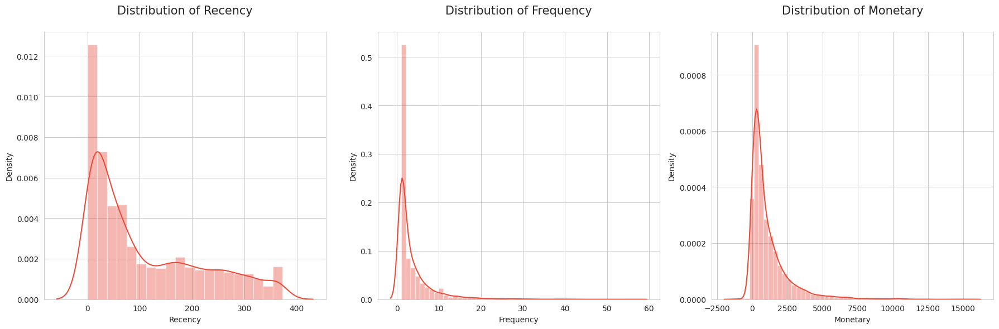

In [ ]:
cont_features = ['Recency', 'Frequency', 'Monetary']

fig, ax = plt.subplots(ncols=3, figsize=(18, 6))

for i, feature in enumerate(cont_features):
    sns.distplot(transactions_cleaned[feature], hist=True, color='#e74c3c', ax=ax[i])
    ax[i].set_title(f'Distribution of {feature}', size=15, y=1.05)

plt.tight_layout()
plt.show()

In [ ]:
# Initialize the StandardScaler
scaler = StandardScaler()

# List of columns that don't need to be scaled
columns_to_exclude = ['CustomerID', 'StockCode', 'Is_UK', 'Favorite_Shopping_Day']

# List of columns that need to be scaled
columns_to_scale = transactions_cleaned.columns.difference(columns_to_exclude)

# Copy the cleaned dataset
transactions_scaled = transactions_cleaned.copy()

# Applying the scaler to the necessary columns in the dataset
transactions_scaled[columns_to_scale] = scaler.fit_transform(transactions_scaled[columns_to_scale])

# Display the first few rows of the scaled data
transactions_scaled.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Std,Spending_Trend,Is_UK
0,1001,"['20774', '20777', '20866', '20869', '20914', ...",-0.095763,-0.583242,-0.227732,0.215660,2.223595,2.479311,-0.324627,2,0.950027,-0.593503,0.056402,1
1,1004,"['84828', '22171', '22173']",1.839628,-0.583242,-0.702473,-0.762558,-0.772181,-0.836338,-0.324627,4,1.367317,-0.593503,0.056402,1
2,1009,"['22992', '22428', '16168M', '16236', '16237',...",-0.542391,-0.366271,-0.343271,-0.163211,0.132132,1.430055,-0.170715,1,1.784606,2.554295,4.281778,1
3,1016,"['23180', '22730', '46000M', '21629', '22727',...",-0.756401,-0.583242,-0.609813,-0.506471,0.012082,-0.430626,-0.324627,3,0.532738,-0.593503,0.056402,1
4,1021,"['21261', '21263', '21314', '21352', '21356', ...",-0.160896,-0.583242,-0.236883,0.292838,2.459951,2.129559,-0.324627,2,1.367317,-0.593503,0.056402,1


In [ ]:
transactions_scaled

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Std,Spending_Trend,Is_UK
0,1001,"['20774', '20777', '20866', '20869', '20914', ...",-0.095763,-0.583242,-0.227732,0.215660,2.223595,2.479311,-0.324627,2,0.950027,-0.593503,0.056402,1
1,1004,"['84828', '22171', '22173']",1.839628,-0.583242,-0.702473,-0.762558,-0.772181,-0.836338,-0.324627,4,1.367317,-0.593503,0.056402,1
2,1009,"['22992', '22428', '16168M', '16236', '16237',...",-0.542391,-0.366271,-0.343271,-0.163211,0.132132,1.430055,-0.170715,1,1.784606,2.554295,4.281778,1
3,1016,"['23180', '22730', '46000M', '21629', '22727',...",-0.756401,-0.583242,-0.609813,-0.506471,0.012082,-0.430626,-0.324627,3,0.532738,-0.593503,0.056402,1
4,1021,"['21261', '21263', '21314', '21352', '21356', ...",-0.160896,-0.583242,-0.236883,0.292838,2.459951,2.129559,-0.324627,2,1.367317,-0.593503,0.056402,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5077,9967,"['22361', '22364', '22378', '22379', '22381', ...",1.672142,-0.583242,-0.601805,-0.452486,0.177408,-0.206784,-0.324627,2,-0.719130,-0.593503,0.056402,1
5078,998,"['20675', '20677', '20719', '20723', '20724', ...",-0.756401,-0.583242,0.349965,2.244053,8.435512,0.226908,-0.324627,4,-1.136420,-0.593503,0.056402,1
5079,9984,"['23052', '23089', '23123', '23182', '23199', ...",0.081028,-0.583242,-0.262050,0.179116,2.111679,1.849757,-0.324627,4,1.367317,-0.593503,0.056402,1
5080,9987,"['20669', '20685', '20700', '20707', '20719', ...",0.295037,-0.583242,0.831570,1.188180,5.201921,5.389247,-0.324627,2,1.367317,-0.593503,0.056402,1


In [ ]:
# Save the scaled dataset to a CSV file
transactions_scaled.to_csv('transactions_scaled.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Dimentionality Reduction:**

## **PCA**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



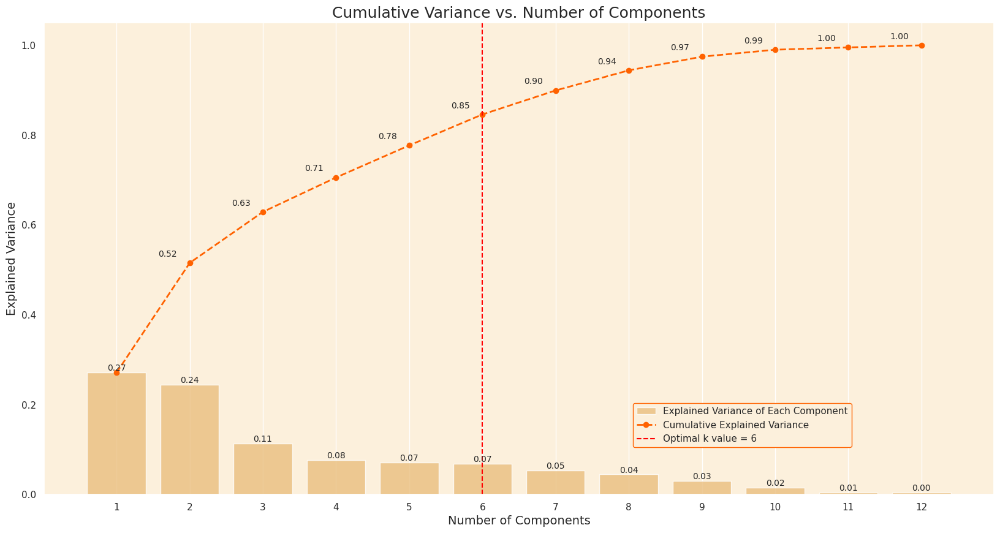

In [ ]:
# Copy transactions_scaled to another variable
transactions_scaled_copy = transactions_scaled.copy()

# Drop the 'StockCode' column from the copy
transactions_scaled_copy.drop(columns=['StockCode'], inplace=True)

# Setting CustomerID as the index column
transactions_scaled_copy.set_index('CustomerID', inplace=True)

# Apply PCA
pca = PCA().fit(transactions_scaled_copy)

# Calculate the Cumulative Sum of the Explained Variance
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_explained_variance = np.cumsum(explained_variance_ratio)

# Set the optimal k value (based on our analysis, we can choose 6)
optimal_k = 6

# Set seaborn plot style
sns.set(rc={'axes.facecolor': '#fcf0dc'}, style='darkgrid')

# Plot the cumulative explained variance against the number of components
plt.figure(figsize=(20, 10))

# Bar chart for the explained variance of each component
barplot = sns.barplot(x=list(range(1, len(cumulative_explained_variance) + 1)),
                      y=explained_variance_ratio,
                      color='#fcc36d',
                      alpha=0.8)

# Line plot for the cumulative explained variance
lineplot, = plt.plot(range(0, len(cumulative_explained_variance)), cumulative_explained_variance,
                     marker='o', linestyle='--', color='#ff6200', linewidth=2)

# Plot optimal k value line
optimal_k_line = plt.axvline(optimal_k - 1, color='red', linestyle='--', label=f'Optimal k value = {optimal_k}')

# Set labels and title
plt.xlabel('Number of Components', fontsize=14)
plt.ylabel('Explained Variance', fontsize=14)
plt.title('Cumulative Variance vs. Number of Components', fontsize=18)

# Customize ticks and legend
plt.xticks(range(0, len(cumulative_explained_variance)))
plt.legend(handles=[barplot.patches[0], lineplot, optimal_k_line],
           labels=['Explained Variance of Each Component', 'Cumulative Explained Variance', f'Optimal k value = {optimal_k}'],
           loc=(0.62, 0.1),
           frameon=True,
           framealpha=1.0,
           edgecolor='#ff6200')

# Display the variance values for both graphs on the plots
x_offset = -0.3
y_offset = 0.01
for i, (ev_ratio, cum_ev_ratio) in enumerate(zip(explained_variance_ratio, cumulative_explained_variance)):
    plt.text(i, ev_ratio, f"{ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)
    if i > 0:
        plt.text(i + x_offset, cum_ev_ratio + y_offset, f"{cum_ev_ratio:.2f}", ha="center", va="bottom", fontsize=10)

plt.grid(axis='both')
plt.show()

In [ ]:
# Creating a PCA object with 6 components
pca = PCA(n_components=6)

# Fitting and transforming the original data to the new PCA dataframe
transactions_pca = pca.fit_transform(transactions_scaled_copy)

# Creating a new dataframe from the PCA dataframe, with columns labeled PC1, PC2, etc.
transactions_pca = pd.DataFrame(transactions_pca, columns=['PC'+str(i+1) for i in range(pca.n_components_)])

# Adding the CustomerID index back to the new PCA dataframe
transactions_pca.index = transactions_scaled_copy.index

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Displaying the resulting dataframe based on the PCs
transactions_pca.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,PC1,PC2,PC3,PC4,PC5,PC6
CustomerID,,,,,,
1001,0.502349,0.781778,-3.005716,-0.281646,0.483791,1.134331
1004,-1.601111,-2.068136,-0.647131,0.048914,0.745526,-0.966623
1009,0.698788,1.748932,-1.089572,-3.704118,1.246846,-1.048229
1016,-0.788838,-0.807299,-0.150973,-0.128375,0.499618,-0.122288
1021,0.446297,0.770763,-3.137576,-0.317538,0.789700,1.140517


In [ ]:
# Define a function to highlight the top 3 absolute values in each column of a dataframe
def highlight_top3(column):
    top3 = column.abs().nlargest(3).index
    return ['background-color:  blue' if i in top3 else '' for i in column.index]

# Create the PCA component DataFrame and apply the highlighting function
pc_df = pd.DataFrame(pca.components_.T, columns=['PC{}'.format(i+1) for i in range(pca.n_components_)],
                     index=transactions_scaled_copy.columns)

pc_df.style.apply(highlight_top3, axis=0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,PC1,PC2,PC3,PC4,PC5,PC6
Recency,-0.258672,-0.040796,-0.311467,0.077694,-0.228036,-0.104952
Frequency,0.421297,0.097890,0.219698,-0.018175,0.043362,-0.255378
Total_Products_Purchased,0.458504,0.128834,0.042434,-0.010547,-0.041241,-0.079268
Monetary,0.475526,0.145608,-0.068742,-0.016085,-0.081163,-0.001320
Average_Transaction_Value,0.105915,0.101698,-0.605041,-0.048466,-0.190966,0.520463
Unique_Products_Purchased,0.339710,0.099651,-0.406056,-0.026619,0.075645,0.114723
Average_Days_Between_Purchases,-0.009161,0.005787,0.411178,-0.283824,0.296481,0.730988
Favorite_Shopping_Day,0.267645,-0.959686,-0.049572,-0.023231,-0.042857,0.043489
Favorite_Shopping_Hour,-0.027856,-0.030949,-0.348600,-0.066001,0.883164,-0.201690
Monthly_Spending_Std,0.346580,0.090367,0.142894,0.163421,0.039097,0.037101


# **Clustering:**

### **Determining the Optimal Number of Clusters: Elbow Method**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



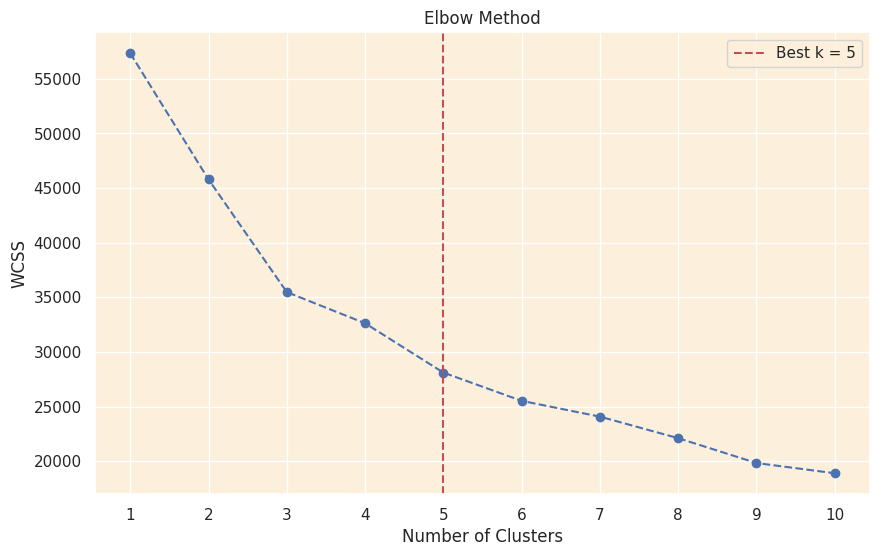

In [ ]:
# Selecting the PCA-transformed columns for clustering
X = transactions_pca

# Initialize an empty list to store the within-cluster sum of squares (WCSS) values
wcss = []

# Fitting KMeans with different values of k
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Finding the elbow point using KneeLocator
kneedle = KneeLocator(range(1, 11), wcss, curve='convex', direction='decreasing')
best_k = kneedle.elbow

# Plotting the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))
plt.grid(True)

# Adding a vertical line for the best k
plt.axvline(x=best_k, color='r', linestyle='--', label=f'Best k = {best_k}')
plt.legend()
plt.show()

It shows the optimal k cluster is 5, however, we want to segment the customers into 3 clusters

## **Clustering Model - K-means**

In [ ]:
# Apply KMeans clustering using the optimal k
kmeans_model = KMeans(n_clusters=3, init='k-means++', n_init=10, max_iter=100, random_state=0)
kmeans_model.fit(transactions_pca)

# Get the frequency of each cluster
cluster_frequencies_kmeans = Counter(kmeans_model.labels_)

# Create a mapping from old labels to new labels based on frequency
label_mapping_kmeans = {old_label: new_label for new_label, (old_label, _) in
                         enumerate(cluster_frequencies_kmeans.most_common())}

# Reverse the mapping to assign labels as per your criteria
label_mapping_kmeans = {new_label: old_label for old_label, new_label in {2: 1, 1: 0, 0: 2}.items()}

# Apply the mapping to get the new labels
new_labels_kmeans = np.array([label_mapping_kmeans[label] for label in kmeans_model.labels_])

# Append the new cluster labels back to the original scaled dataset
transactions_scaled['cluster_kmeans'] = new_labels_kmeans

# Append the new cluster labels back to the original scaled dataset copy
transactions_scaled_copy['cluster_kmeans'] = new_labels_kmeans

# Append the new cluster labels to the PCA version of the dataset
transactions_pca['cluster_kmeans'] = new_labels_kmeans

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Display the count of each cluster
print("Cluster Counts:")
for cluster, count in cluster_frequencies_kmeans.items():
    print(f"Cluster {cluster}: {count}")

Cluster Counts:
Cluster 2: 2324
Cluster 0: 2103
Cluster 1: 655


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



In [ ]:
# Display the first few rows of the original dataframe
transactions_scaled.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Std,Spending_Trend,Is_UK,cluster_kmeans
0,1001,"['20774', '20777', '20866', '20869', '20914', ...",-0.095763,-0.583242,-0.227732,0.215660,2.223595,2.479311,-0.324627,2,0.950027,-0.593503,0.056402,1,0
1,1004,"['84828', '22171', '22173']",1.839628,-0.583242,-0.702473,-0.762558,-0.772181,-0.836338,-0.324627,4,1.367317,-0.593503,0.056402,1,1
2,1009,"['22992', '22428', '16168M', '16236', '16237',...",-0.542391,-0.366271,-0.343271,-0.163211,0.132132,1.430055,-0.170715,1,1.784606,2.554295,4.281778,1,0
3,1016,"['23180', '22730', '46000M', '21629', '22727',...",-0.756401,-0.583242,-0.609813,-0.506471,0.012082,-0.430626,-0.324627,3,0.532738,-0.593503,0.056402,1,1
4,1021,"['21261', '21263', '21314', '21352', '21356', ...",-0.160896,-0.583242,-0.236883,0.292838,2.459951,2.129559,-0.324627,2,1.367317,-0.593503,0.056402,1,0


### **K-means Evaluation**

**3D Visualization of Top Principal Components**

In [ ]:
# Define colors for the clusters
colors = ['blue', 'red', 'green']

# Create separate data frames for each cluster
cluster_0_kmeans = transactions_pca[transactions_pca['cluster_kmeans'] == 0]
cluster_1_kmeans = transactions_pca[transactions_pca['cluster_kmeans'] == 1]
cluster_2_kmeans = transactions_pca[transactions_pca['cluster_kmeans'] == 2]

# Create a 3D scatter plot
fig = go.Figure()

# Add data points for each cluster separately and specify the color
fig.add_trace(go.Scatter3d(x=cluster_0_kmeans['PC1'], y=cluster_0_kmeans['PC2'], z=cluster_0_kmeans['PC3'],
                           mode='markers', marker=dict(color=colors[0], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1_kmeans['PC1'], y=cluster_1_kmeans['PC2'], z=cluster_1_kmeans['PC3'],
                           mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 1'))
fig.add_trace(go.Scatter3d(x=cluster_2_kmeans['PC1'], y=cluster_2_kmeans['PC2'], z=cluster_2_kmeans['PC3'],
                           mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 2'))

# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1', tickfont=dict(size=14)),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2', tickfont=dict(size=14)),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3', tickfont=dict(size=14)),
    ),
    width=900,
    height=800,
    font=dict(size=16, family="Arial, bold")  # Increase font size and make it bold
)

# Show the plot
fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Cluster Distribution**

In [ ]:
# Calculate the percentage of customers in each cluster
cluster_percentage_kmeans = (pd.Series(kmeans_model.labels_).value_counts(normalize=True) * 100).reset_index()
cluster_percentage_kmeans.columns = ['Cluster', 'Percentage']
cluster_percentage_kmeans.sort_values(by='Cluster', inplace=True)

# Create an interactive horizontal bar plot
fig = px.bar(cluster_percentage_kmeans, x='Percentage', y='Cluster', orientation='h', color='Cluster',
             color_discrete_sequence=px.colors.qualitative.Set3,
             title='Distribution of Customers Across Clusters',
             labels={'Percentage': 'Percentage (%)', 'Cluster': 'Cluster'})

# Update the text template to format the percentage with two decimal places
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Update the figure layout
fig.update_layout(
    xaxis=dict(tickvals=list(range(0, 101, 10)), tickfont=dict(size=20)),  # Increase x-axis tick font size
    yaxis=dict(title=None, tickfont=dict(size=20)),  # Increase y-axis tick font size
    showlegend=False,
    height=800,  # Adjust the height
    width=1800,  # Adjust the width
    font=dict(size=22, family="Arial, bold")  # Increase font size and make it bold
)

fig.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Evaluation Metrics**

In [ ]:
# Compute number of customers
num_observations_kmeans = len(transactions_scaled_copy)

# Separate the features and the cluster labels
X_kmeans = transactions_scaled_copy.drop('cluster_kmeans', axis=1)
clusters_kmeans = transactions_scaled_copy['cluster_kmeans']

# Compute the metrics
sil_score_kmeans = silhouette_score(X_kmeans, clusters_kmeans)
calinski_score_kmeans = calinski_harabasz_score(X_kmeans, clusters_kmeans)
davies_score_kmeans = davies_bouldin_score(X_kmeans, clusters_kmeans)

# Create a table to display the metrics and the number of observations
table_data_kmeans = [
    ["Number of Observations", num_observations_kmeans],
    ["Silhouette Score", sil_score_kmeans],
    ["Calinski Harabasz Score", calinski_score_kmeans],
    ["Davies Bouldin Score", davies_score_kmeans]
]

# Print the table
print(tabulate(table_data_kmeans, headers=["Metric", "Value"], tablefmt='pretty'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



+-------------------------+---------------------+
|         Metric          |        Value        |
+-------------------------+---------------------+
| Number of Observations  |        5082         |
|    Silhouette Score     | 0.21798565373564963 |
| Calinski Harabasz Score | 1214.3687026666817  |
|  Davies Bouldin Score   |  1.498730109194775  |
+-------------------------+---------------------+


## **Clustering Model - K-medoids**

In [ ]:
# Fit K Medoids clustering
k = 3  # number of clusters
initial_medoids = [0, 1, 2]  # you can initialize medoids manually or randomly
kmedoids_instance = kmedoids(transactions_pca.values, initial_medoids, data_type='distance_matrix')
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()
medoids = kmedoids_instance.get_medoids()

# Assign cluster labels
new_labels_kmedoids = np.zeros(len(transactions_pca), dtype=int)  # Define labels as integer array
for cluster_id, cluster in enumerate(clusters):
    new_labels_kmedoids[cluster] = cluster_id

# Append the new cluster labels back to the original scaled dataset
transactions_scaled['cluster_kmedoids'] = new_labels_kmedoids

# Append the new cluster labels back to the original scaled dataset copy
transactions_scaled_copy['cluster_kmedoids'] = new_labels_kmedoids

# Append the new cluster labels to the PCA version of the dataset
transactions_pca['cluster_kmedoids'] = new_labels_kmedoids

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



### **K-medoids Evaluation**

**3D Visualization of Top Principal Components**

In [ ]:
# Define colors for the clusters
colors = ['blue', 'red', 'green']

# Create separate data frames for each cluster
cluster_0_kmedoids = transactions_pca[transactions_pca['cluster_kmedoids'] == 0]
cluster_1_kmedoids = transactions_pca[transactions_pca['cluster_kmedoids'] == 1]
cluster_2_kmedoids = transactions_pca[transactions_pca['cluster_kmedoids'] == 2]

# Create a 3D scatter plot
fig = go.Figure()

# Add data points for each cluster separately and specify the color
fig.add_trace(go.Scatter3d(x=cluster_0_kmedoids['PC1'], y=cluster_0_kmedoids['PC2'], z=cluster_0_kmedoids['PC3'],
                           mode='markers', marker=dict(color=colors[0], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1_kmedoids['PC1'], y=cluster_1_kmedoids['PC2'], z=cluster_1_kmedoids['PC3'],
                           mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 1'))
fig.add_trace(go.Scatter3d(x=cluster_2_kmedoids['PC1'], y=cluster_2_kmedoids['PC2'], z=cluster_2_kmedoids['PC3'],
                           mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 2'))

# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space (K Medoids)', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1', tickfont=dict(size=14)),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2', tickfont=dict(size=14)),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3', tickfont=dict(size=14)),
    ),
    width=900,
    height=800,
    font=dict(size=16, family="Arial, bold")  # Increase font size and make it bold
)

# Show the plot
fig.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Cluster Distribution**

In [ ]:
# Calculate the percentage of customers in each cluster
cluster_percentage_kmedoids = (pd.Series(new_labels_kmedoids).value_counts(normalize=True) * 100).reset_index()
cluster_percentage_kmedoids.columns = ['Cluster', 'Percentage']
cluster_percentage_kmedoids.sort_values(by='Cluster', inplace=True)

# Create an interactive horizontal bar plot
fig = px.bar(cluster_percentage_kmedoids, x='Percentage', y='Cluster', orientation='h', color='Cluster',
             color_discrete_sequence=px.colors.qualitative.Set3,
             title='Distribution of Customers Across Clusters (K Medoids)',
             labels={'Percentage': 'Percentage (%)', 'Cluster': 'Cluster'})

# Update the text template to format the percentage with two decimal places
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Update the figure layout
fig.update_layout(
    xaxis=dict(tickvals=list(range(0, 101, 10)), tickfont=dict(size=20)),  # Increase x-axis tick font size
    yaxis=dict(title=None, tickfont=dict(size=20)),  # Increase y-axis tick font size
    showlegend=False,
    height=800,  # Adjust the height
    width=1800,  # Adjust the width
    font=dict(size=22, family="Arial, bold")  # Increase font size and make it bold
)

fig.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Evaluation Metrics**

In [ ]:
# Compute number of customers
num_observations_kmedoids = len(transactions_scaled_copy)

# Separate the features and the cluster labels
X_kmedoids = transactions_scaled_copy.drop('cluster_kmedoids', axis=1)
clusters_kmedoids = transactions_scaled_copy['cluster_kmedoids']

# Compute the metrics
sil_score_kmedoids = silhouette_score(X_kmedoids, clusters_kmedoids)
calinski_score_kmedoids = calinski_harabasz_score(X_kmedoids, clusters_kmedoids)
davies_score_kmedoids = davies_bouldin_score(X_kmedoids, clusters_kmedoids)

# Create a table to display the metrics and the number of observations
table_data_kmedoids = [
    ["Number of Observations", num_observations_kmedoids],
    ["Silhouette Score (K Medoids)", sil_score_kmedoids],
    ["Calinski Harabasz Score (K Medoids)", calinski_score_kmedoids],
    ["Davies Bouldin Score (K Medoids)", davies_score_kmedoids]
]

# Print the table
print(tabulate(table_data_kmedoids, headers=["Metric", "Value"], tablefmt='pretty'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



+-------------------------------------+---------------------+
|               Metric                |        Value        |
+-------------------------------------+---------------------+
|       Number of Observations        |        5082         |
|    Silhouette Score (K Medoids)     | 0.08405764256393373 |
| Calinski Harabasz Score (K Medoids) |  444.4661536898917  |
|  Davies Bouldin Score (K Medoids)   |  7.725619935666889  |
+-------------------------------------+---------------------+


## **Clustering Model - Hierarchical**

In [ ]:
# Apply Agglomerative clustering
hierarchical_model = AgglomerativeClustering(n_clusters=3)
hierarchical_model.fit(transactions_pca)

# Get the frequency of each cluster
cluster_frequencies_hierarchical = Counter(hierarchical_model.labels_)

# Create a mapping from old labels to new labels based on frequency
label_mapping_hierarchical = {label: new_label for new_label, (label, _) in
                 enumerate(cluster_frequencies_hierarchical.most_common())}

# Reverse the mapping to assign labels as per your criteria
label_mapping_hierarchical = {v: k for k, v in {2: 1, 1: 0, 0: 2}.items()}

# Apply the mapping to get the new labels
new_labels_hierarchical = np.array([label_mapping_hierarchical[label] for label in hierarchical_model.labels_])

# Append the new cluster labels back to the original scaled dataset
transactions_scaled['cluster_hierarchical'] = new_labels_hierarchical

# Append the new cluster labels back to the original scaled dataset copy
transactions_scaled_copy['cluster_hierarchical'] = new_labels_hierarchical

# Append the new cluster labels to the PCA version of the dataset
transactions_pca['cluster_hierarchical'] = new_labels_hierarchical

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



### **Hierarchical Evaluation**

**3D Visualization of Top Principal Components**

In [ ]:
# Define colors for the clusters
colors = ['blue', 'red', 'green']

# Create separate data frames for each cluster
cluster_0_hierarchical = transactions_pca[transactions_pca['cluster_hierarchical'] == 0]
cluster_1_hierarchical = transactions_pca[transactions_pca['cluster_hierarchical'] == 1]
cluster_2_hierarchical = transactions_pca[transactions_pca['cluster_hierarchical'] == 2]

# Create a 3D scatter plot
fig = go.Figure()

# Add data points for each cluster separately and specify the color
fig.add_trace(go.Scatter3d(x=cluster_0_hierarchical['PC1'], y=cluster_0_hierarchical['PC2'], z=cluster_0_hierarchical['PC3'],
                           mode='markers', marker=dict(color=colors[0], size=5, opacity=0.4), name='Cluster 0'))
fig.add_trace(go.Scatter3d(x=cluster_1_hierarchical['PC1'], y=cluster_1_hierarchical['PC2'], z=cluster_1_hierarchical['PC3'],
                           mode='markers', marker=dict(color=colors[1], size=5, opacity=0.4), name='Cluster 1'))
fig.add_trace(go.Scatter3d(x=cluster_2_hierarchical['PC1'], y=cluster_2_hierarchical['PC2'], z=cluster_2_hierarchical['PC3'],
                           mode='markers', marker=dict(color=colors[2], size=5, opacity=0.4), name='Cluster 2'))

# Set the title and layout details
fig.update_layout(
    title=dict(text='3D Visualization of Customer Clusters in PCA Space (Hierarchical Clustering)', x=0.5),
    scene=dict(
        xaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC1', tickfont=dict(size=14)),
        yaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC2', tickfont=dict(size=14)),
        zaxis=dict(backgroundcolor="#fcf0dc", gridcolor='white', title='PC3', tickfont=dict(size=14)),
    ),
    width=900,
    height=800,
    font=dict(size=16, family="Arial, bold")  # Increase font size and make it bold
)

# Show the plot
fig.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Cluster Distribution**

In [ ]:
# Calculate the percentage of customers in each cluster
cluster_percentage_hierarchical = (pd.Series(hierarchical_model.labels_).value_counts(normalize=True) * 100).reset_index()
cluster_percentage_hierarchical.columns = ['Cluster', 'Percentage']
cluster_percentage_hierarchical.sort_values(by='Cluster', inplace=True)

# Create an interactive horizontal bar plot
fig = px.bar(cluster_percentage_hierarchical, x='Percentage', y='Cluster', orientation='h', color='Cluster',
             color_discrete_sequence=px.colors.qualitative.Set3,
             title='Distribution of Customers Across Clusters (Hierarchical Clustering)',
             labels={'Percentage': 'Percentage (%)', 'Cluster': 'Cluster'})

# Update the text template to format the percentage with two decimal places
fig.update_traces(texttemplate='%{x:.2f}%', textposition='outside')

# Update the figure layout
fig.update_layout(
    xaxis=dict(tickvals=list(range(0, 101, 10)), tickfont=dict(size=20)),  # Increase x-axis tick font size
    yaxis=dict(title=None, tickfont=dict(size=20)),  # Increase y-axis tick font size
    showlegend=False,
    height=800,  # Adjust the height
    width=1800,  # Adjust the width
    font=dict(size=22, family="Arial, bold")  # Increase font size and make it bold
)

fig.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



**Evaluation Metrics**

In [ ]:
# Compute number of customers
num_observations_hierarchical = len(transactions_scaled_copy)

# Separate the features and the cluster labels
X_hierarchical = transactions_scaled_copy.drop('cluster_hierarchical', axis=1)
clusters_hierarchical = transactions_scaled_copy['cluster_hierarchical']

# Compute the metrics
sil_score_hierarchical = silhouette_score(X_hierarchical, clusters_hierarchical)
calinski_score_hierarchical = calinski_harabasz_score(X_hierarchical, clusters_hierarchical)
davies_score_hierarchical = davies_bouldin_score(X_hierarchical, clusters_hierarchical)

# Create a table to display the metrics and the number of observations
table_data_hierarchical = [
    ["Number of Observations", num_observations_hierarchical],
    ["Silhouette Score (Hierarchical)", sil_score_hierarchical],
    ["Calinski Harabasz Score (Hierarchical)", calinski_score_hierarchical],
    ["Davies Bouldin Score (Hierarchical)", davies_score_hierarchical]
]

# Print the table
print(tabulate(table_data_hierarchical, headers=["Metric", "Value"], tablefmt='pretty'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



+----------------------------------------+--------------------+
|                 Metric                 |       Value        |
+----------------------------------------+--------------------+
|         Number of Observations         |        5082        |
|    Silhouette Score (Hierarchical)     | 0.2114609954190933 |
| Calinski Harabasz Score (Hierarchical) | 1119.7032188722326 |
|  Davies Bouldin Score (Hierarchical)   | 1.5784856195865336 |
+----------------------------------------+--------------------+


# **Cluster Analysis and Profiling**

## **Radar Chart Approach**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



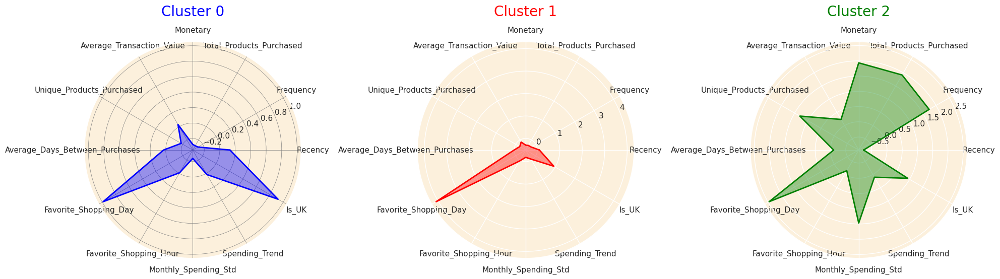

In [ ]:
# Store 'cluster_hierarchical' and 'cluster_kmedoids' columns in another variable
clusters = transactions_scaled_copy[['cluster_hierarchical', 'cluster_kmedoids']].copy()

# Drop 'cluster_hierarchical' and 'cluster_kmedoids' columns from transactions_scaled_copy
transactions_scaled_copy.drop(columns=['cluster_hierarchical', 'cluster_kmedoids'], inplace=True)

# Calculate the centroids of each cluster
cluster_centroids = transactions_scaled_copy.groupby('cluster_kmeans').mean()

# Function to create a radar chart
def create_radar_chart(ax, angles, data, color, cluster):
    # Plot the data and fill the area
    ax.fill(angles, data, color=color, alpha=0.4)
    ax.plot(angles, data, color=color, linewidth=2, linestyle='solid')

    # Add a title
    ax.set_title(f'Cluster {cluster}', size=20, color=color, y=1.1)

# Set data
labels=np.array(cluster_centroids.columns)
num_vars = len(labels)

# Compute angle of each axis
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is circular, so we need to "complete the loop" and append the start to the end
labels = np.concatenate((labels, [labels[0]]))
angles += angles[:1]

# Initialize the figure
fig, ax = plt.subplots(figsize=(20, 10), subplot_kw=dict(polar=True), nrows=1, ncols=3)

# Create radar chart for each cluster
for i, color in enumerate(colors):
    data = cluster_centroids.loc[i].tolist()
    data += data[:1]  # Complete the loop
    create_radar_chart(ax[i], angles, data, color, i)

# Add input data
for i in range(3):
    ax[i].set_xticks(angles[:-1])
    ax[i].set_xticklabels(labels[:-1])

# Add a grid
ax[0].grid(color='grey', linewidth=0.5)

# Display the plot
plt.tight_layout()
plt.show()

In [ ]:
# Save the scaled dataset to a CSV file
transactions_scaled.to_csv('transactions_scaled.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



# **Frequent Pattern Mining:**

In [ ]:
transactions_scaled = pd.read_csv('/content/drive/MyDrive/transactions_scaled.csv', encoding='latin-1')
transactions_scaled

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,CustomerID,StockCode,Recency,Frequency,Total_Products_Purchased,Monetary,Average_Transaction_Value,Unique_Products_Purchased,Average_Days_Between_Purchases,Favorite_Shopping_Day,Favorite_Shopping_Hour,Monthly_Spending_Std,Spending_Trend,Is_UK,cluster_kmeans,cluster_kmedoids,cluster_hierarchical
0,1001,"['20774', '20777', '20866', '20869', '20914', ...",-0.095763,-0.583242,-0.227732,0.215660,2.223595,2.479311,-0.324627,2,0.950027,-0.593503,0.056402,1,0,0,1
1,1004,"['84828', '22171', '22173']",1.839628,-0.583242,-0.702473,-0.762558,-0.772181,-0.836338,-0.324627,4,1.367317,-0.593503,0.056402,1,1,1,0
2,1009,"['22992', '22428', '16168M', '16236', '16237',...",-0.542391,-0.366271,-0.343271,-0.163211,0.132132,1.430055,-0.170715,1,1.784606,2.554295,4.281778,1,0,0,2
3,1016,"['23180', '22730', '46000M', '21629', '22727',...",-0.756401,-0.583242,-0.609813,-0.506471,0.012082,-0.430626,-0.324627,3,0.532738,-0.593503,0.056402,1,1,1,0
4,1021,"['21261', '21263', '21314', '21352', '21356', ...",-0.160896,-0.583242,-0.236883,0.292838,2.459951,2.129559,-0.324627,2,1.367317,-0.593503,0.056402,1,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5077,9967,"['22361', '22364', '22378', '22379', '22381', ...",1.672142,-0.583242,-0.601805,-0.452486,0.177408,-0.206784,-0.324627,2,-0.719130,-0.593503,0.056402,1,0,2,1
5078,998,"['20675', '20677', '20719', '20723', '20724', ...",-0.756401,-0.583242,0.349965,2.244053,8.435512,0.226908,-0.324627,4,-1.136420,-0.593503,0.056402,1,2,2,1
5079,9984,"['23052', '23089', '23123', '23182', '23199', ...",0.081028,-0.583242,-0.262050,0.179116,2.111679,1.849757,-0.324627,4,1.367317,-0.593503,0.056402,1,1,1,1
5080,9987,"['20669', '20685', '20700', '20707', '20719', ...",0.295037,-0.583242,0.831570,1.188180,5.201921,5.389247,-0.324627,2,1.367317,-0.593503,0.056402,1,2,2,1


In [ ]:
# Assuming transactions_scaled is your dataframe
transactions_scaled.drop(columns=['cluster_kmedoids', 'cluster_hierarchical'], inplace=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
# Define a function to perform frequent pattern mining
def frequent_pattern_mining(data, min_support=0.06):
    # Convert the StockCode column to lists
    data['StockCode'] = data['StockCode'].apply(eval)

    # Use TransactionEncoder to encode the transaction data
    te = TransactionEncoder()
    te_ary = te.fit(data['StockCode']).transform(data['StockCode'])
    transaction_df = pd.DataFrame(te_ary, columns=te.columns_)

    # Apply FP-Growth algorithm to extract frequent patterns
    frequent_itemsets = fpgrowth(transaction_df, min_support=min_support, use_colnames=True)

    return frequent_itemsets


# Define a function to generate association rules with a minimum confidence
def generate_rules(frequent_itemsets, metric="lift", min_threshold=1, min_confidence=0.5):
    rules = association_rules(frequent_itemsets, metric=metric, min_threshold=min_threshold)
    # Filter rules based on confidence
    rules = rules[rules['confidence'] >= min_confidence].reset_index(drop=True)
    return rules


def map_stockcodes_to_descriptions(rules_df, cust_df, antecedent_column, consequent_column, antecedent_description_column='Antecedent_Description', consequent_description_column='Consequent_Description'):
    # Convert the tuples of stock codes to lists in rules_df
    rules_df[antecedent_column] = rules_df[antecedent_column].apply(lambda x: eval(str(x)))
    rules_df[consequent_column] = rules_df[consequent_column].apply(lambda x: eval(str(x)))

    # Create a set of all unique stock codes in rules_df
    all_stock_codes = set()
    for codes in rules_df[antecedent_column]:
        all_stock_codes.update(codes)
    for codes in rules_df[consequent_column]:
        all_stock_codes.update(codes)

    # Create a dictionary mapping stock codes to descriptions
    stockcode_to_description = dict(zip(cust_df['StockCode'], cust_df['Description']))

    # Create new columns for descriptions in rules_df
    rules_df[antecedent_description_column] = rules_df[antecedent_column].apply(lambda x: [stockcode_to_description[code] for code in x])
    rules_df[consequent_description_column] = rules_df[consequent_column].apply(lambda x: [stockcode_to_description[code] for code in x])

    return rules_df

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **Create separate DataFrames for each cluster**

In [ ]:
# Convert cluster_frequencies to a DataFrame
cluster_counts = pd.DataFrame(list(cluster_frequencies_kmeans.items()), columns=['Cluster', 'Count'])

# Sort the DataFrame by cluster
cluster_counts.sort_values(by='Cluster', inplace=True)

cluster_counts

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning:

`should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.



,Cluster,Count
1,0,2103
2,1,655
0,2,2324


In [ ]:
# Create separate DataFrames for each cluster
cluster0_df = transactions_scaled[transactions_scaled['cluster_kmeans'] == 0]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
cluster1_df = transactions_scaled[transactions_scaled['cluster_kmeans'] == 1]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
cluster2_df = transactions_scaled[transactions_scaled['cluster_kmeans'] == 2]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **Perform frequent pattern mining for each cluster**

In [ ]:
# Perform frequent pattern mining for each cluster
frequent_itemsets_cluster0 = frequent_pattern_mining(cluster0_df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
frequent_itemsets_cluster1 = frequent_pattern_mining(cluster1_df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
frequent_itemsets_cluster2 = frequent_pattern_mining(cluster2_df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **Display frequent itemsets for each cluster**

In [ ]:
# Display frequent itemsets for each cluster
print("Frequent Itemsets for Cluster 0:")
frequent_itemsets_cluster0

Frequent Itemsets for Cluster 0:


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.178571,(85099B)
1,0.167814,(22423)
2,0.166954,(47566)
3,0.157057,(85123A)
4,0.138124,(22457)
...,...,...
114,0.087349,"(22386, 85099B)"
115,0.065835,"(22386, 21931)"
116,0.062392,"(22386, 22411)"
117,0.068417,"(22698, 22697)"


In [ ]:
print("\nFrequent Itemsets for Cluster 1:")
frequent_itemsets_cluster1


Frequent Itemsets for Cluster 1:


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,support,itemsets
0,0.124108,(22720)
1,0.075131,(23355)
2,0.074655,(22111)
3,0.067047,(21733)
4,0.065145,(22727)
...,...,...
88,0.066096,(23322)
89,0.089396,(21790)
90,0.072753,(22112)
91,0.066096,"(22386, 85099B)"


In [ ]:
print("\nFrequent Itemsets for Cluster 2:")
frequent_itemsets_cluster2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Frequent Itemsets for Cluster 2:


,support,itemsets
0,0.390840,(85099B)
1,0.343511,(22720)
2,0.309924,(22457)
3,0.297710,(22469)
4,0.296183,(22961)
...,...,...
89039,0.070229,"(22114, 23355, 23356)"
89040,0.065649,"(23356, 23355, 85123A)"
89041,0.068702,"(23300, 23302)"
89042,0.068702,"(23302, 23301)"


## **Generate association rules for each cluster**

In [ ]:
# Generate association rules for each cluster
rules_cluster0 = generate_rules(frequent_itemsets_cluster0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
rules_cluster1 = generate_rules(frequent_itemsets_cluster1)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
rules_cluster2 = generate_rules(frequent_itemsets_cluster2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **Display association rules for each cluster**

In [ ]:
# Display association rules for each cluster
print("Association Rules for Cluster 0:")
mapped_rules_cluster0 = map_stockcodes_to_descriptions(rules_cluster0, cust_df, 'antecedents', 'consequents')
mapped_rules_cluster0

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Association Rules for Cluster 0:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,Antecedent_Description,Consequent_Description
0,(85099C),(85099B),0.099398,0.178571,0.073580,0.740260,4.145455,0.055830,3.162500,0.842516,[JUMBO BAG BAROQUE BLACK WHITE],[JUMBO BAG RED RETROSPOT]
1,(23199),(85099B),0.091652,0.178571,0.060241,0.657277,3.680751,0.043874,2.396771,0.801803,[JUMBO BAG APPLES],[JUMBO BAG RED RETROSPOT]
2,(21928),(85099B),0.086919,0.178571,0.065835,0.757426,4.241584,0.050313,3.386297,0.836989,[JUMBO BAG SCANDINAVIAN BLUE PAISLEY],[JUMBO BAG RED RETROSPOT]
3,(22411),(85099B),0.124785,0.178571,0.079174,0.634483,3.553103,0.056891,2.247305,0.821005,[JUMBO SHOPPER VINTAGE RED PAISLEY],[JUMBO BAG RED RETROSPOT]
4,(21931),(22411),0.121773,0.124785,0.072289,0.593640,4.757305,0.057094,2.153790,0.899308,[JUMBO STORAGE BAG SUKI],[JUMBO SHOPPER VINTAGE RED PAISLEY]
5,(22411),(21931),0.124785,0.121773,0.072289,0.579310,4.757305,0.057094,2.087589,0.902403,[JUMBO SHOPPER VINTAGE RED PAISLEY],[JUMBO STORAGE BAG SUKI]
6,(21931),(85099B),0.121773,0.178571,0.083477,0.685512,3.838869,0.061732,2.611958,0.842045,[JUMBO STORAGE BAG SUKI],[JUMBO BAG RED RETROSPOT]
7,(22697),(22699),0.115749,0.114458,0.083046,0.717472,6.268441,0.069798,3.134353,0.950489,[GREEN REGENCY TEACUP AND SAUCER],[ROSES REGENCY TEACUP AND SAUCER ]
8,(22699),(22697),0.114458,0.115749,0.083046,0.725564,6.268441,0.069798,3.222066,0.949103,[ROSES REGENCY TEACUP AND SAUCER ],[GREEN REGENCY TEACUP AND SAUCER]
9,(21931),(20712),0.121773,0.102840,0.063683,0.522968,5.085264,0.051160,1.880713,0.914744,[JUMBO STORAGE BAG SUKI],[JUMBO BAG WOODLAND ANIMALS]


In [ ]:
rules_cluster0.to_csv('rules_cluster0.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print("\nAssociation Rules for Cluster 1:")
mapped_rules_cluster1 = map_stockcodes_to_descriptions(rules_cluster1, cust_df, 'antecedents', 'consequents')
mapped_rules_cluster1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Association Rules for Cluster 1:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,Antecedent_Description,Consequent_Description
0,(22386),(85099B),0.093676,0.139325,0.066096,0.705584,5.064309,0.053045,2.923328,0.885488,[JUMBO BAG PINK POLKADOT],[JUMBO BAG RED RETROSPOT]
1,(22697),(22699),0.087494,0.082739,0.063243,0.722826,8.736226,0.056004,3.309334,0.970442,[GREEN REGENCY TEACUP AND SAUCER],[ROSES REGENCY TEACUP AND SAUCER ]
2,(22699),(22697),0.082739,0.087494,0.063243,0.764368,8.736226,0.056004,3.872586,0.965411,[ROSES REGENCY TEACUP AND SAUCER ],[GREEN REGENCY TEACUP AND SAUCER]


In [ ]:
rules_cluster1.to_csv('rules_cluster1.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
print("\nAssociation Rules for Cluster 2:")
mapped_rules_cluster2 = map_stockcodes_to_descriptions(rules_cluster2, cust_df, 'antecedents', 'consequents')
mapped_rules_cluster2

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



Association Rules for Cluster 2:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric,Antecedent_Description,Consequent_Description
0,(22720),(22423),0.343511,0.406107,0.174046,0.506667,1.247619,0.034543,1.203837,0.302326,[SET OF 3 CAKE TINS PANTRY DESIGN ],[REGENCY CAKESTAND 3 TIER]
1,"(22423, 85099B)",(22720),0.158779,0.343511,0.082443,0.519231,1.511538,0.027900,1.365496,0.402299,"[REGENCY CAKESTAND 3 TIER, JUMBO BAG RED RETRO...",[SET OF 3 CAKE TINS PANTRY DESIGN ]
2,"(22720, 47566)",(85123A),0.141985,0.363359,0.082443,0.580645,1.597994,0.030851,1.518144,0.436141,"[SET OF 3 CAKE TINS PANTRY DESIGN , PARTY BUNT...",[CREAM HANGING HEART T-LIGHT HOLDER]
3,"(22720, 85123A)",(47566),0.163359,0.343511,0.082443,0.504673,1.469159,0.026327,1.325364,0.381691,"[SET OF 3 CAKE TINS PANTRY DESIGN , CREAM HANG...",[PARTY BUNTING]
4,"(47566, 85123A)",(22720),0.158779,0.343511,0.082443,0.519231,1.511538,0.027900,1.365496,0.402299,"[PARTY BUNTING, CREAM HANGING HEART T-LIGHT HO...",[SET OF 3 CAKE TINS PANTRY DESIGN ]
...,...,...,...,...,...,...,...,...,...,...,...,...
2193859,(23302),(23300),0.096183,0.212214,0.068702,0.714286,3.365879,0.048291,2.757252,0.777703,[KNEELING MAT HOUSEWORK DESIGN],[GARDENERS KNEELING PAD CUP OF TEA ]
2193860,(23302),(23301),0.096183,0.224427,0.068702,0.714286,3.182702,0.047116,2.714504,0.758784,[KNEELING MAT HOUSEWORK DESIGN],[GARDENERS KNEELING PAD KEEP CALM ]
2193861,"(23300, 23302)",(23301),0.068702,0.224427,0.061069,0.888889,3.960695,0.045650,6.980153,0.802664,"[GARDENERS KNEELING PAD CUP OF TEA , KNEELING ...",[GARDENERS KNEELING PAD KEEP CALM ]
2193862,"(23302, 23301)",(23300),0.068702,0.212214,0.061069,0.888889,4.188649,0.046489,7.090076,0.817418,"[KNEELING MAT HOUSEWORK DESIGN, GARDENERS KNE...",[GARDENERS KNEELING PAD CUP OF TEA ]


In [ ]:
rules_cluster2.to_csv('rules_cluster2.csv', index=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
